In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
mapping_df = pd.read_csv('C:/Users/KornkamolSampaongern/DocumentInformationExtraction/data/intermediate/analysis/heading_mapping.csv')
project_df = pd.read_csv('C:/Users/KornkamolSampaongern/DocumentInformationExtraction/data/intermediate/analysis/project_detail.csv')

In [3]:
df = pd.merge(mapping_df, project_df, on=['id','filename'])

In [4]:
df.columns

Index(['id', 'filename', 'heading', 'category', 'State/Province', 'Proponent',
       'VCS Project Status', 'Estimated Annual Emission Reductions',
       'VCS Project Type', 'VCS Methodology', 'VCS Project Validator',
       'Project Registration Date', 'Crediting Period Term', 'links',
       'filename_raw', 'updated_date', 'file_size'],
      dtype='object')

In [5]:
df['Project Registration Year'] = pd.to_datetime(df['Project Registration Date'], format='%d/%m/%Y').dt.year

In [6]:
df['Credit Period Start'] = df['Crediting Period Term'].str.extract(r'(\d{2}/\d{2}/\d{4}) -')[0]
df['Credit Period End'] = df['Crediting Period Term'].str.extract(r'- (\d{2}/\d{2}/\d{4})')[0]
df['Project Life Time'] =  pd.to_datetime(df['Credit Period End'], format='%d/%m/%Y').dt.year - pd.to_datetime(df['Credit Period Start'], format='%d/%m/%Y').dt.year

In [7]:
df.id.nunique()

337

In [8]:
df.category.unique()

array(['project_summary', nan, 'project_proponent', 'other_entities',
       'project_start_date', 'ghg_emission_reduction', 'project_location',
       'baseline_analysis', 'additional_analysis', 'leakage_analysis',
       'natural_catastrophe_climate_change',
       'net_positive_community_impacts',
       'net_positive_biodiversity_impacts', 'project_size',
       'project_lifetime', 'standard', 'project_version',
       'compliance_with_laws_statutes_property_rights_and_other'],
      dtype=object)

In [9]:
df.head(2)

,id,filename,heading,category,State/Province,Proponent,VCS Project Status,Estimated Annual Emission Reductions,VCS Project Type,VCS Methodology,...,Project Registration Date,Crediting Period Term,links,filename_raw,updated_date,file_size,Project Registration Year,Credit Period Start,Credit Period End,Project Life Time
0,2615,2615_vcs_joint_pd-mr_(v4.0)_jiajia_jiayi_cmm_(...,1.1 Summary Description of the Project,project_summary,Guizhou,Guizhou Panjiang CBM Development&Utilization C...,Registered,129988.0,Energy industries (renewable/non-renewable sou...,ACM0008,...,31/01/2022,"1st, 19/01/2020 - 18/01/2030",https://registry.verra.org/mymodule/ProjectDoc...,VCS Joint PD-MR (v4.0) Jiajia Jiayi CMM (v3.1)...,31/01/2022,1946012,2022.0,19/01/2020,18/01/2030,10
1,2615,2615_vcs_joint_pd-mr_(v4.0)_jiajia_jiayi_cmm_(...,1.2 Sectoral Scope and Project Type,NaN,Guizhou,Guizhou Panjiang CBM Development&Utilization C...,Registered,129988.0,Energy industries (renewable/non-renewable sou...,ACM0008,...,31/01/2022,"1st, 19/01/2020 - 18/01/2030",https://registry.verra.org/mymodule/ProjectDoc...,VCS Joint PD-MR (v4.0) Jiajia Jiayi CMM (v3.1)...,31/01/2022,1946012,2022.0,19/01/2020,18/01/2030,10


In [10]:
country_mapping = {
    "Rio Grande do Sul and Santa Catarina": "Brazil",
    "Sichuan Province": "China",
    "Gansu": "China",
    "Guizhou": "China",
    "Mato Grosso do Sul": "Brazil",
    "Regions RM, V, VI, VII, VIII": "Chile",
    "Pernambuco": "Brazil",
    "Guizhou Province": "China",
    "PA": "Brazil",
    "Henan Province": "China",
    "Jaisalmer district in Rajasthan": "India",
    "Madre de Dios": "Peru",
    "Karnataka": "India",
    "Department Francisco Morazán": "Honduras",
    "Pará": "Brazil",
    "Southern Atlantic Autonomous Region (RAAS)": "Nicaragua",
    "Pará state": "Brazil",
    "Hebei Province": "China",
    "Songyuan City, Jilin Province": "China",
    "Jilin": "China",
    "San Paulo": "Brazil",
    "Eastern Mediterranean Region": "Turkey",
    "Nakhorn Ratchasima Province": "Thailand",
    "Rio de Janeiro": "Brazil",
    "Beijing": "China",
    "southern bank of the Valparaiso River": "Argentina",
    "northern bank of the Valparaiso River": "Argentina",
    "Amapá": "Brazil",
    "Himachal Pradesh": "India",
    "Brazilian Amazon": "Brazil",
    "Gorno-Badakhshan Autonomous Oblast (GBAO)": "Tajikistan",
    "East Sepik province": "Papua New Guinea",
    "Peruvian Amazon Basin": "Peru",
    "Chungchongnam-do": "South Korea",
    "Amazonas State": "Brazil",
    "Uttar Pradesh": "India",
    "MA": "United States",
    "Jiangxi": "China",
    "Tamil nadu": "India",
    "West Java Province": "Indonesia",
    "Region XIV": "Chile",
    "Uttaranchal": "India",
    "Elazığ and Tunceli Provinces": "Turkey",
    "Eastern and Southern Provinces": "Zambia",
    "Lusaka": "Zambia",
    "Jurisdictions of Elazığ and Tunceli Provinces": "Turkey",
    "Tucumán": "Argentina",
    "Yunnan": "China",
    "Liaoning province": "China",
    "Sindh": "Pakistan",
    "Nyanza and Western provinces": "Kenya",
    "State of Para, micro region of Porte": "Brazil",
    "Colombian Orinoco": "Colombia",
    "Gujarat": "India",
    "Tahuamanu": "Peru",
    "Andhra Pradesh": "India",
    "New Ireland and East New Britain Province": "Papua New Guinea",
    "Tamilnadu": "India",
    "District: Mohali": "India",
    "Shandong Province": "China",
    "Guangxi Zhuang Autonomous Region": "China",
    "Toamasina Province": "Madagascar",
    "OK": "United States",
    "Multiple States/Provinces": "Various",
    "Kutch, Gujarat": "India",
    "Casamance": "Senegal",
    "Lindi": "Tanzania",
    "Para State": "Brazil",
    "Hubei Province": "China",
    "San Pedro, Canindeyu": "Paraguay",
    "Anhui Province": "China",
    "Oromia Regional State": "Ethiopia",
    "IL": "United States",
    "Gansu Province": "China",
    "Tamilnadu & Karnataka": "India",
    "Jilin Province": "China",
    "Jiangsu Province": "China",
    "Orientale Province": "DR Congo",
    "Ucayali": "Peru",
    "Guangxi": "China",
    "Tonkolili and Port Loko Districts": "Sierra Leone",
    "Caldas": "Colombia",
    "Odisha, Andhra Pradesh and Chhattisgarh": "India",
    "Acre": "Brazil",
    "Ashanti": "Ghana",
    "KY": "United States",
    "Nariño": "Colombia",
    "Chocó": "Colombia",
    "Santa Catarina": "Brazil",
    "Peten": "Guatemala",
    "Inner Mongolia Autonomous Region": "China",
    "Central East region": "Brazil",
    "Eastern & Uva Provinces": "Sri Lanka",
    "Department of Vichada": "Colombia",
    "Izabal": "Guatemala",
    "Bursa Province": "Turkey",
    "Rajasthan": "India",
    "Taiba Ndiaye": "Senegal",
    "Zhejiang Province": "China",
    "state of Rondônia": "Brazil",
    "Madhya Pradesh": "India",
    "Yong’an City, Fujian Province": "China",
    "Punjab Andhra Pradesh & others": "India",
    "NE states": "India",
    "Coast": "Kenya",
    "Presidente Hayes Department": "Paraguay",
    "Antioquia and Arauca": "Colombia",
    "Chongqing": "China",
    "Chhattisgarh": "India",
    "Eastern provinces": "Sierra Leone",
    "District: Siddipet, State: Telangana": "India",
    "BC": "Canada",
    "Coast Province": "Kenya",
    "Punjab": "India",
    "MI": "United States",
    "Mondulkiri": "Cambodia",
    "State: Amazonas": "Brazil",
    "VA": "United States",
    "NSW": "Australia",
    "Fujian Province": "China",
    "Toledo District": "Belize",
    "Acre and Amazonas": "Brazil",
    "State of Mato Grosso": "Brazil",
    "Karnataka, Tamil Nadu": "India",
    "Sabah": "Malaysia",
    "Kabarole": "Uganda",
    "Central Kalimantan": "Indonesia",
    "Guangxi Province": "China",
    "Chattishgarh": "India",
    "Inner Mongolia Autonomous": "China",
    "Inner Mongolia Autonomous Region": "China",
    "Guatemala COUNTRY-WIDE": "Guatemala",
    "Multi State": "Various",
    "Haryana": "India",
    "Chitradurga District of Karnataka": "India",
    "ÇANKIRI": "Turkey",
    "Tabasco": "Mexico",
    "Guangdong Province": "China",
    "Koh Kong Province": "Cambodia",
    "Kabupaten Batubara, Sumetera Utara": "Indonesia",
    "Jamnagar and Rajkot districts": "India",
    "Central, Rift Valley and Eastern Provinces": "Kenya",
    "ND": "United States",
    "Telangana, Gujarat, Rajasthan": "India",
    "Telangana,": "India",
    "Eastern and Lusaka Province": "Zambia",
    "Rize": "Turkey",
    "SD": "United States",
    "Sikkim state": "India",
    "Andhra Pradesh, Rajasthan, Karnataka": "India",
    "Shanxi Province": "China",
    "Sine Saloum and Casamance": "Senegal",
    "Shenzhen City, Guangdong Province": "China",
    "Multiple State": "Various",
    "San Martin": "Peru",
    "Eastern Uganda": "Uganda",
    "Qinghai": "China",
    "Odisha": "India",
    "Multiple States": "Various",
    "Rondônia and Amazonas": "Brazil",
    "Pará State, Eastern Amazon": "Brazil",
    "XinJiang": "China",
    "Ningxia Autonomous Region, P. R. China": "China",
    "Orange Walk": "Belize",
    "Department of Chocó and the Municipality of Acandí": "Colombia",
    "Mariscal Cáceres and Huallaga Provinces": "Peru",
    "Telengana and Maharashtra": "India",
    "Department of Madre de Dios": "Peru",
    "AK": "United States",
    "Hunan Province": "China",
    "Tanganyika District": "Tanzania",
    "Mato Grosso": "Brazil",
    "South Sumatra Province": "Indonesia",
    "Kiteto District": "Tanzania",
    "State of Bahia": "Brazil",
    "Choco": "Colombia",
    "Valle": "Colombia",
    "Valle de Cauca": "Colombia",
    "Antioquia and Choco": "Colombia",
    "Department of Cauca": "Colombia",
    "Inner Mongolia Autonomous": "China",
    "Chengde City, Hebei Province": "China",
    "Makueni, Taita Taveta, and Kajiado Counties": "Kenya",
    "Matabeleland North, Midlands, Mashonaland West, and Mashonaland Central": "Zimbabwe",
    "Hebei": "China",
    "Uttar Pradesh, Telangana, Andhra Pradesh, Gujarat": "India",
    "Inner Mongolia": "China",
    "Jammu & Kashmir": "India",
    "Saraburi, Lampang,  Nakon Si Thammarat": "Thailand",
    "Nakhon Ratchasima": "Thailand",
    "Para": "Brazil",
    "Mai Ndombe": "DR Congo",
    "Sichuan": "China",
    "Maharashtra": "India",
    "Rajasthan, Gujarat, Karnataka, Tamil Nadu, Ma": "India",
    "Dhaka": "Bangladesh",
    "SC": "United States",
    "Chongqing, Yunnan, Sichuan and Guizhou Province": "China",
    "West Bengal": "India",
    "San Martin province": "Peru",
    "Cerro Chato/ Valentines and Regis/ Garao Regions": "Uruguay",
    "Cerro Largo and Treinta y Tres": "Uruguay",
    "Amazonas": "Brazil",
    "San Juan": "Argentina",
    "Vichada": "Colombia",
    "Jiangsu": "China",
    "TX": "United States",
    "Para, micro region of Portel": "Brazil",
    "East Godavari District, Andhra Pradesh": "India",
    "Aceh and North Sumatra provinces": "Indonesia",
    "San Martin and Amazonas": "Peru",
    "Multiple": "Various",
    "Rayong": "Thailand",
    "municipalities of Machadinho d’Oeste and Cujubim": "Brazil",
    "South-Western and South-Eastern provinces": "Uganda",
    "Bengkulu": "Indonesia",
    "North Sumatra Province": "Indonesia",
    "Free State and Mpumalanga provinces": "South Africa",
    "District of Kullu of Himachal Pradesh": "India",
    "Tamil Nadu, Karnataka, Andhra Pradesh": "India",
    "Tuyen Quang Province": "Vietnam",
    "Rio de Janiero": "Brazil",
    "Ordu Province": "Turkey",
    "Eastern Province": "Zambia"
}

In [11]:
country_df = pd.DataFrame(list(country_mapping.items()), columns=['State/Province', 'Country'])

In [12]:
df = pd.merge(df, country_df, on='State/Province', how='left')

In [13]:
df['heading_number'] = df['heading'].str.extract(r'(\d+\.\d+)')
df['heading_name'] = df['heading'].str.extract(r'\d+\.\d+\s+(.*)')
df['section'] = df['heading_number'].str.split('.').str[0]

In [14]:
categories = [
     'project_proponent'
    ,'other_entities'
    ,'ghg_emission_reduction'
    ,'project_version'
    ,'date_issue_of_project'
    ,'project_start_date'
    ,'project_lifetime'
    ,'expected_first_vintage_of_credit_issuance'
    ,'project_country'
    ,'project_location'
    ,'project_summary'
    ,'standard'
    ,'project_size'
    ,'natural_catastrophe_climate_change'
    ,'additional_analysis'
    ,'leakage_analysis'
    ,'baseline_analysis'
    ]

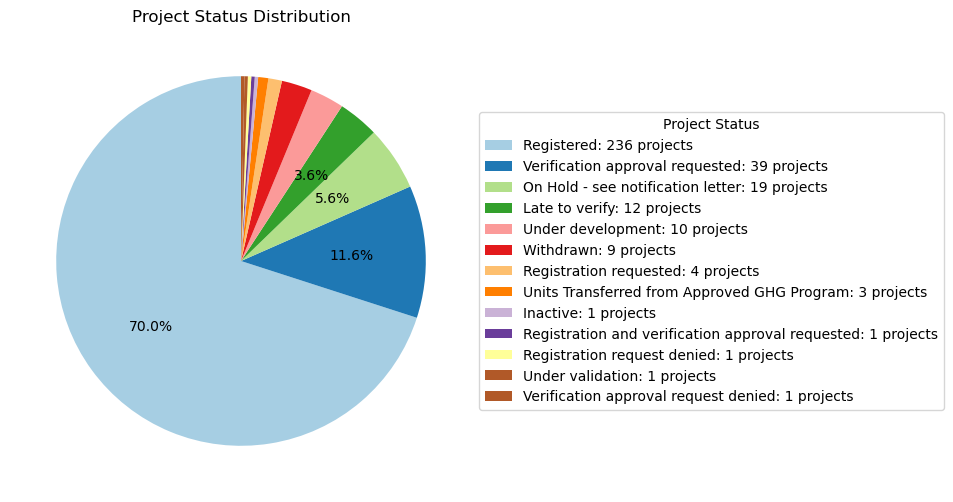

In [15]:
def autopct_func(pct):
    return ('%1.1f%%' % pct) if pct > 3 else ''

status_counts = df.groupby('VCS Project Status')['id'].nunique().sort_values(ascending=False)

plt.figure(figsize=(10, 6))
colors = plt.cm.Paired(range(len(status_counts)))
wedges, texts, autotexts = plt.pie(status_counts, autopct=autopct_func, startangle=90, colors=colors)

legend_labels = [f"{status}: {count} projects" for status, count in zip(status_counts.index, status_counts)]
plt.legend(wedges, legend_labels, title="Project Status", loc="center left", bbox_to_anchor=(1, 0.5))
plt.title('Project Status Distribution')
plt.show()

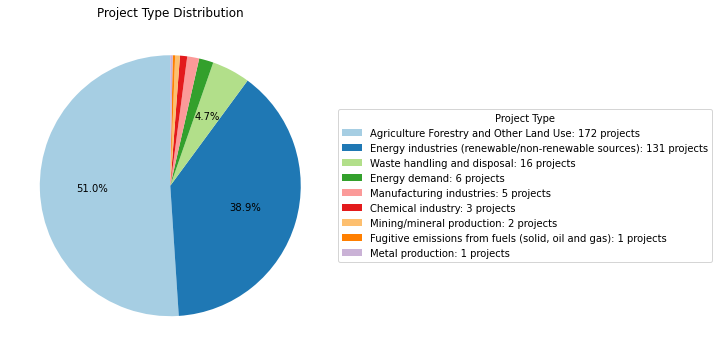

In [242]:
def autopct_func(pct):
    return ('%1.1f%%' % pct) if pct > 3 else ''

status_counts = df.groupby('VCS Project Type')['id'].nunique().sort_values(ascending=False)

plt.figure(figsize=(10, 6))
colors = plt.cm.Paired(range(len(status_counts)))
wedges, texts, autotexts = plt.pie(status_counts, autopct=autopct_func, startangle=90, colors=colors)

legend_labels = [f"{status}: {count} projects" for status, count in zip(status_counts.index, status_counts)]
plt.legend(wedges, legend_labels, title="Project Type", loc="center left", bbox_to_anchor=(1, 0.5))
plt.title('Project Type Distribution')
plt.show()

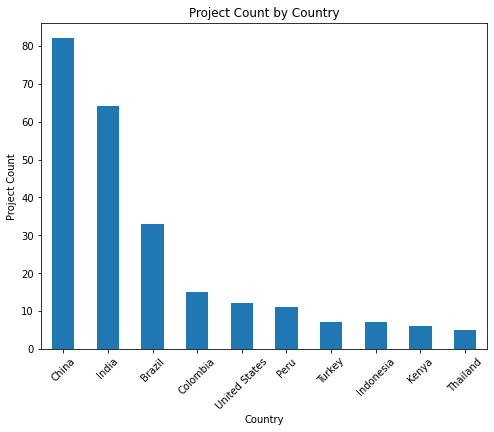

In [243]:
result = df.groupby('Country')['id'].nunique().sort_values(ascending=False)[:10]

plt.figure(figsize=(8, 6))
result.plot(kind='bar')
plt.xlabel('Country')
plt.ylabel('Project Count')
plt.title('Project Count by Country')
plt.xticks(rotation=45)
plt.show()

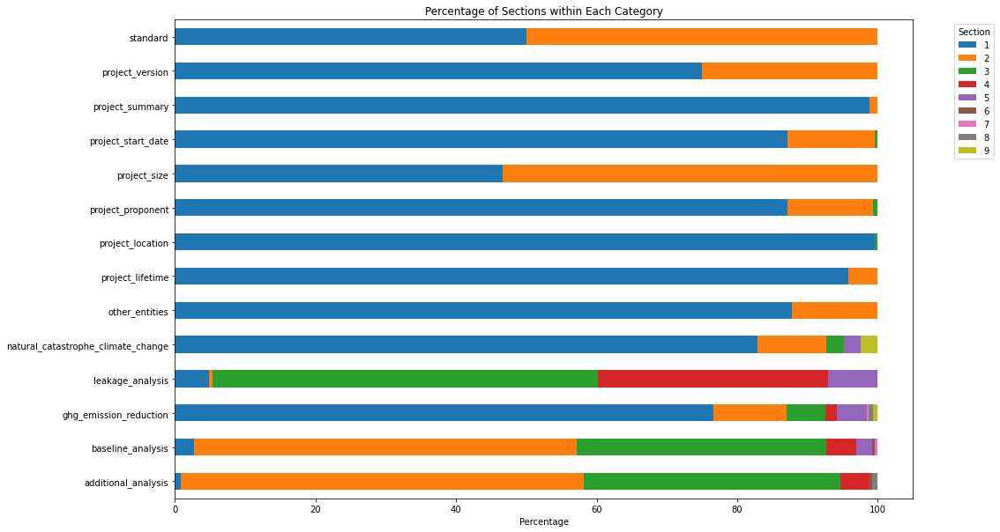

In [244]:
filtered_df = df[df['category'].isin(categories)]
agg_data = filtered_df.groupby(['category', 'section'])['id'].nunique().unstack(fill_value=0)
percentage_data = agg_data.div(agg_data.sum(axis=1), axis=0) * 100

ax = percentage_data.plot(kind='barh', stacked=True, figsize=(15, 10))

plt.xlabel('Percentage')
plt.ylabel('')
plt.title('Percentage of Sections within Each Category')
plt.legend(title='Section', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

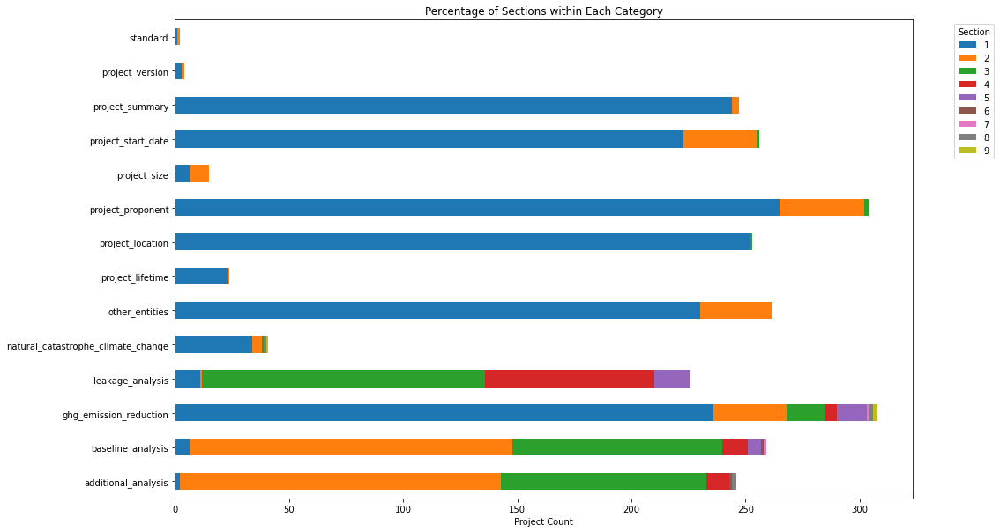

In [245]:
ax = agg_data.plot(kind='barh', stacked=True, figsize=(15, 10))

plt.xlabel('Project Count')
plt.ylabel('')
plt.title('Percentage of Sections within Each Category')
plt.legend(title='Section', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

### Project Proponent

In [246]:
agg_data.loc['project_proponent']

section
1    265
2     37
3      2
4      0
5      0
6      0
7      0
8      0
9      0
Name: project_proponent, dtype: int64

In [247]:
df[(df['category']=='project_proponent')&(df['section']=='2')]['heading_name'].unique()

array(['Project Proponent (G1.1)',
       'Community and Stakeholder Identification and Involvement in Project Design (G3.8) ........ 67',
       'Project Proponent (G1.1) 13', 'Project Proponent',
       'MW Rice husk based cogeneration plant at Hanuman Agro Industries Limited',
       'Project Proponent (G1.1).', 'Project Proponents (G1.1)'],
      dtype=object)

In [248]:
df[df['heading_name']=='Community and Stakeholder Identification and Involvement in Project Design (G3.8) ........ 67']

,id,filename,heading,category,State/Province,Proponent,VCS Project Status,Estimated Annual Emission Reductions,VCS Project Type,VCS Methodology,...,updated_date,file_size,Project Registration Year,Credit Period Start,Credit Period End,Project Life Time,Country,heading_number,heading_name,section
1316,1408,1408_proj_desc_1408_23jun2015.pdf,2.7.1 Community and Stakeholder Identification...,project_proponent,"Makueni, Taita Taveta, and Kajiado Counties",Chyulu Hills Conservation Trust,Registered,1100943.0,Agriculture Forestry and Other Land Use,VM0009,...,29/09/2016,17908855,2020.0,19/09/2013,18/09/2043,30,Kenya,2.7,Community and Stakeholder Identification and I...,2


The project 1408 contains project proponent in section 1.4, but GPT3.5 mapped with inaccurate result.

In [249]:
df[df['heading_name']=='MW Rice husk based cogeneration plant at Hanuman Agro Industries Limited']

,id,filename,heading,category,State/Province,Proponent,VCS Project Status,Estimated Annual Emission Reductions,VCS Project Type,VCS Methodology,...,updated_date,file_size,Project Registration Year,Credit Period Start,Credit Period End,Project Life Time,Country,heading_number,heading_name,section
14780,584,584_proj_desc_584_30oct2008.pdf,2.5 MW Rice husk based cogeneration plant at H...,project_proponent,Chhattisgarh,Hanuman Agro Industries Ltd.,Registered,32563.0,Energy industries (renewable/non-renewable sou...,AMS-I.C.,...,10/05/2017,2157114,2020.0,31/08/2006,30/08/2016,10,India,2.5,MW Rice husk based cogeneration plant at Hanum...,2


The headings of this project use different format such as A.1, the extraction part cannot work effectively.

In [250]:
df[(df['category']=='project_proponent')&(df['section']=='3')]['heading_name'].unique()

array(['COMPLIANCE WITH LAWS, STATUES, PROPERTY RIGHTS AND OTHER REGULATORY FRAMEWORKS (G4 & G5)',
       'Compliance with Relevant National and Local Laws, Regulations, and International',
       'Approval from the Appropriate Authorities, Including Established Formal and/or Traditional',
       'Encroachment on Private, Community or Government Property without Free Prior and',
       'Involuntary Relocation of People or Activities Important for Livelihood or Culture (G5.4.) .. 79',
       'Project Proponent and Other Entities'], dtype=object)

In [251]:
df[df['heading_name']=='Project Proponent and Other Entities']

,id,filename,heading,category,State/Province,Proponent,VCS Project Status,Estimated Annual Emission Reductions,VCS Project Type,VCS Methodology,...,updated_date,file_size,Project Registration Year,Credit Period Start,Credit Period End,Project Life Time,Country,heading_number,heading_name,section
4403,902,902_070.01_kariba_redd+_project_validation_rep...,3.1.1 Project Proponent and Other Entities,project_proponent,"Matabeleland North, Midlands, Mashonaland West...",Carbon Green Investments (Guernsey),On Hold - see notification letter,6550464.0,Agriculture Forestry and Other Land Use,VM0009,...,11/06/2014,1396955,2020.0,01/07/2011,30/06/2041,30,Zimbabwe,3.1,Project Proponent and Other Entities,3


Only one project from selected 337 projects that project proponent staying in other section, apart from section 1.

In [252]:
df[(df['category']=='project_proponent')]['heading_name']

4                                        Project Proponent
63                                Project Proponent (G1.1)
207                               Project Proponent (G1.1)
345                                      Project Proponent
396                                      PROJECT PROPONENT
                               ...                        
17854    Project proponents roles and responsibilities,...
17877                            Project Proponents (G1.1)
18060                                    Project Proponent
18093                                    Project Proponent
18094                                    Project Proponent
Name: heading_name, Length: 334, dtype: object

### Other entities

In [253]:
agg_data.loc['other_entities']

section
1    230
2     32
3      0
4      0
5      0
6      0
7      0
8      0
9      0
Name: other_entities, dtype: int64

In [254]:
df[(df['category']=='other_entities')&(df['section']=='2')]['heading_name'].unique()

array(['Other Entities Involved in the Project',
       'Other Entities Involved in the Project 14'], dtype=object)

### project_summary

In [255]:
agg_data.loc['project_summary']

section
1    244
2      3
3      0
4      0
5      0
6      0
7      0
8      0
9      0
Name: project_summary, dtype: int64

In [256]:
df[(df['category']=='project_summary')&(df['section']=='2')]['heading_name'].unique()

array(['Summary Description of the Project (G1.2) 10',
       'Summary Description of the Project (G1.2)'], dtype=object)

### project_start_date

In [257]:
agg_data.loc['project_start_date']

section
1    223
2     32
3      1
4      0
5      0
6      0
7      0
8      0
9      0
Name: project_start_date, dtype: int64

In [258]:
df[(df['category']=='project_start_date')&(df['section']=='2')]['heading_name'].unique()

array(['Project Start Date', 'Project Start Date 36'], dtype=object)

In [259]:
df[(df['category']=='project_start_date')&(df['section']=='3')]['heading_name'].unique()

array(['Project Start Date'], dtype=object)

### ghg_emission_reduction

In [260]:
agg_data.loc['ghg_emission_reduction']

section
1    236
2     32
3     17
4      5
5     13
6      0
7      1
8      2
9      2
Name: ghg_emission_reduction, dtype: int64

In [261]:
df[(df['category']=='ghg_emission_reduction')&(df['section']=='2')]['heading_name'].unique()

array(['Estimated GHG Emission Reductions or Removals',
       'Benefits Assessment and Crediting Period (G1.9) 36',
       'Estimated GHG Emission Reductions or Removals 37'], dtype=object)

In [262]:
df[(df['category']=='ghg_emission_reduction')&(df['section']=='3')]['heading_name'].unique()

array(['Quantification of GHG Emission Reductions and Removals',
       'Summary of GHG Emission Reductions and Removals',
       'Project scale and estimated GHG emission reductions or removals',
       'Net GHG Emission Reductions and Removals',
       'Summary of GHG Emission Reductions and/or Removals',
       'Estimate the New GHG Emissions Reduction from Cookstoves and Fuel Efficiency (CFE)'],
      dtype=object)

In [263]:
df[(df['category']=='ghg_emission_reduction')&(df['section']=='4')]['heading_name'].unique()

array(['GHG Emission Reductions 17',
       'Quantifying GHG emission reductions and removal enhancements for the',
       nan,
       'Section 8.1.5: Calculation of baseline scenario greenhouse gas emissions from change in',
       'EXAMPLE OF NET ANTHROPOGENIC GHG EMISSIONS AND REMOVALS FOR THE INITIAL PROJECT INSTANCES ... 59'],
      dtype=object)

In [264]:
df[(df['category']=='ghg_emission_reduction')&(df['section']=='5')]['heading_name'].unique()

array(['PROJECT SCALE AND ESTIMATED GHG EMISSION REDUCTIONS OR REMOVALS',
       'Project Scale and Estimated GHG Emission Reductions or Removals',
       'PROJECT SCALE AND ESTIMATED GHG EMISSIONS REDUCTIONS AND REMOVALS 106',
       'Net Impact on Biodiversity (CCB: G2.5, G3.2, G3.6, B1.1, B1.2, B1.3, B1.4, B1.5, B2.1, B2.2,',
       'Net Impact on Biodiversity (CCB: G2.5, G3.2, G3.6, B1.1, B1.2, B1.3, B1.4,',
       'Ex ante estimation of actual carbon stock changes and non-CO emissions in the project',
       'Project Scale and Estimated GHG Emissions Reductions or Removals',
       nan], dtype=object)

In [265]:
df[df['heading_name']=='Ex ante estimation of actual carbon stock changes and non-CO emissions in the project']

,id,filename,heading,category,State/Province,Proponent,VCS Project Status,Estimated Annual Emission Reductions,VCS Project Type,VCS Methodology,...,updated_date,file_size,Project Registration Year,Credit Period Start,Credit Period End,Project Life Time,Country,heading_number,heading_name,section
12332,1541,1541_proj_desc_1541_07jun2016.pdf,5.4.1 Ex ante estimation of actual carbon stoc...,ghg_emission_reduction,Peten,Multiple Proponents,Registered,238875.0,Agriculture Forestry and Other Land Use,VM0015,...,09/02/2017,9857615,2020.0,01/02/2012,31/01/2042,30,Guatemala,5.4,Ex ante estimation of actual carbon stock chan...,5


In [266]:
df[(df['category']=='ghg_emission_reduction')&(df['section']=='7')]['heading_name'].unique()

array(['Estimated Changes in Biodiversity in the Project Zone as a Result of the Project (B1.1)',
       'Potential Adverse Effects of Non-native Species, Including Impacts on Native Species and'],
      dtype=object)

In [267]:
df[(df['category']=='ghg_emission_reduction')&(df['section']=='8')]['heading_name'].unique()

array(['Projects that reduce GHG emissions from activities',
       'Estimating Emissions from Above Ground Large Tree Biomass',
       'Estimating Emissions from Above Ground Small Tree Biomass',
       'Estimating Emissions from Above Ground Non-Tree Biomass',
       'Estimating Emissions from Below Ground Large Tree Biomass',
       'Estimating Emissions from Below Ground Small Tree Biomass',
       'Estimating Emissions from Below Ground Non-Tree Biomass',
       'Estimating Emissions from Standing Dead Wood',
       'Estimating Emissions from Lying Dead Wood',
       'Estimating Emissions from Soil',
       'Estimating Emissions from Wood Products'], dtype=object)

In [268]:
df[(df['category']=='ghg_emission_reduction')&(df['section']=='9')]['heading_name'].unique()

array(['Emissions from Burning',
       'Carbon Credits. On such terms as the Parties may agree, the Parties undertake to consider'],
      dtype=object)

In [269]:
df[df['heading_name']=='Estimating Emissions from Above Ground Large Tree Biomass']

,id,filename,heading,category,State/Province,Proponent,VCS Project Status,Estimated Annual Emission Reductions,VCS Project Type,VCS Methodology,...,updated_date,file_size,Project Registration Year,Credit Period Start,Credit Period End,Project Life Time,Country,heading_number,heading_name,section
5513,562,562_proj_desc_562_31jan2011.pdf,8.1 Estimating Emissions from Above Ground Lar...,ghg_emission_reduction,Coast,Wildlife Works Carbon LLC,Registered,251432.0,Agriculture Forestry and Other Land Use,VM0009,...,02/11/2016,3614412,2020.0,01/01/2005,31/12/2034,29,Kenya,8.1,Estimating Emissions from Above Ground Large T...,8


ghg_emission_reduction normally stay in section 1 and can be up until section 8.

### project_location

In [270]:
agg_data.loc['project_location']

section
1    252
2      0
3      1
4      0
5      0
6      0
7      0
8      0
9      0
Name: project_location, dtype: int64

In [271]:
df[(df['category']=='project_location')&(df['section']=='3')]['heading_name'].unique()

array(['Project Location'], dtype=object)

### natural_catastrophe_climate_change

In [272]:
agg_data.loc['natural_catastrophe_climate_change']

section
1    34
2     4
3     1
4     0
5     1
6     0
7     0
8     0
9     1
Name: natural_catastrophe_climate_change, dtype: int64

In [273]:
df[(df['category']=='natural_catastrophe_climate_change')&(df['section']=='9')]['heading_name'].unique()

array(['Forest Fires'], dtype=object)

In [274]:
df[(df['category']=='natural_catastrophe_climate_change')&(df['section']=='5')]['heading_name'].unique()

array(['Identify likely regional climate change and climate variability scenarios and impacts, and',
       'Identify any risks to the project’s climate, community and biodiversity benefits and how',
       'Demonstrate that current or anticipated climate changes are having or are likely to have an',
       'Demonstrate that the project activities will assist communities and/or biodiversity to adapt'],
      dtype=object)

In [275]:
df[(df['category']=='natural_catastrophe_climate_change')&(df['section']=='3')]['heading_name'].unique()

array(['Identification of likely natural and No natural or human-induced risks are'],
      dtype=object)

In [276]:
df[(df['category']=='natural_catastrophe_climate_change')&(df['section']=='2')]['heading_name'].unique()

array(['CLIMATE RISKS',
       'Natural and Human-induced Risks to the Expected Climate, Community and Biodiversity',
       'Sustainable Development 35'], dtype=object)

In [277]:
df[(df['category']=='natural_catastrophe_climate_change')&(df['section']=='1')]['heading_name'].unique()

array(['CLIMATE OBJECTIVES',
       'Risks affecting the project and its reporting',
       'Identification of risks that may substantially',
       'Identification of risks that may substantially affect the project’s GHG emission',
       'Climate', 'Identification of risks that may substantially affect',
       'Identification of risks that may substantially affect the project’s GHG',
       'Identification of risks that may substantially affect the project’s',
       'Climate:',
       'Identification of risks that may substantially affect the project’s GHG emission reductions or removal',
       nan, 'Identification of risks that may substantially affect the',
       'Risk analysis'], dtype=object)

### Similarity Score

In [278]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
import spacy


nlp = spacy.load("en_core_web_md") 

In [286]:
nlp = spacy.load("en_core_web_md") 

sentences = ["project proponents (G1.1) 13",
"project proponent"]

embeddings = [nlp(sentence).vector for sentence in sentences]

from math import sqrt, pow, exp
 
def squared_sum(x):
  """ return 3 rounded square rooted value """
 
  return round(sqrt(sum([a*a for a in x])),3)


def cos_similarity(x,y):
  """ return cosine similarity between two lists """
 
  numerator = sum(a*b for a,b in zip(x,y))
  denominator = squared_sum(x)*squared_sum(y)
  return round(numerator/float(denominator),3)

cos_similarity(embeddings[0], embeddings[1])

0.166

In [311]:
proponent_df['heading'].unique()

array(['1.5 Project Proponent', '2.1.3 Project Proponent (G1.1)',
       '1.3 Project Proponent', '1.4 PROJECT PROPONENT',
       '1.4.1 MULTIPLE PROJECT PROPONENTS', '1.1 Project title',
       '1.15 Project participants, roles and responsibilities',
       '1.4 Project Proponent (G1.1)',
       '1.3.3 Description of Communities Located in Project Zone, Including Basic Socio-Economic and',
       '1.3.4 Current Land Use, Customary and Legal Property Rights, and any Ongoing or Unresolved',
       '1.3.5 Current Biodiversity in Project Zone (species and ecosystems), and Threats to that',
       '2.7.1 Community and Stakeholder Identification and Involvement in Project Design (G3.8) ........ 67',
       '3.1 COMPLIANCE WITH LAWS, STATUES, PROPERTY RIGHTS AND OTHER REGULATORY FRAMEWORKS (G4 & G5)',
       '3.1.2 Compliance with Relevant National and Local Laws, Regulations, and International',
       '3.1.3 Approval from the Appropriate Authorities, Including Established Formal and/or Tra

In [279]:
import spacy
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity

# Load the spaCy model (or any other pre-trained model for embeddings)
nlp = spacy.load("en_core_web_md")  # Use a medium-sized model for decent embeddings

# Filter DataFrame
proponent_df = df[(df['category'] == 'project_proponent') & (~df['heading_name'].isna())]

# Text to compare
text_to_compare = 'project proponent'

# Extract headings and add the text to compare to the list
all_texts = proponent_df['heading_name'].tolist() + [text_to_compare]

# Compute embeddings
embeddings = [nlp(text).vector for text in all_texts]

# Separate embeddings for headings and the text to compare
heading_embeddings = embeddings[:-1]
compare_embedding = embeddings[-1:]

# Compute cosine similarities
cosine_similarities = cosine_similarity(compare_embedding, heading_embeddings)

# Add cosine similarities to DataFrame
proponent_df['cosine_similarity'] = cosine_similarities.flatten()

# Display results
result_df = proponent_df[['cosine_similarity', 'heading_name']].drop_duplicates()
result_df

C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_6512\1757176707.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proponent_df['cosine_similarity'] = cosine_similarities.flatten()


,cosine_similarity,heading_name
4,0.757072,Project Proponent
63,0.161884,Project Proponent (G1.1)
396,-0.010314,PROJECT PROPONENT
397,0.033307,MULTIPLE PROJECT PROPONENTS
1105,0.468080,Project title
1119,0.691310,"Project participants, roles and responsibilities"
1312,0.551326,Description of Communities Located in Project ...
1313,0.501269,"Current Land Use, Customary and Legal Property..."
1314,0.542364,Current Biodiversity in Project Zone (species ...
1316,0.510003,Community and Stakeholder Identification and I...


In [52]:
proponent_df = df[(df['category'] == 'project_proponent') & (~df['heading_name'].isna())]

text_to_compare = 'project proponent'

all_texts = proponent_df['heading_name'].tolist() + [text_to_compare]

vectorizer = TfidfVectorizer()

tfidf_matrix = vectorizer.fit_transform(all_texts)

cosine_similarities = cosine_similarity(tfidf_matrix[-1], tfidf_matrix[:-1])

proponent_df['cosine_similarity'] = cosine_similarities.flatten()
proponent_df[['cosine_similarity', 'heading_name']].drop_duplicates()

C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_18564\305920703.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proponent_df['cosine_similarity'] = cosine_similarities.flatten()


,cosine_similarity,heading_name
4,1.000000,Project Proponent
63,0.460891,Project Proponent (G1.1)
396,1.000000,PROJECT PROPONENT
397,0.122292,MULTIPLE PROJECT PROPONENTS
1105,0.123531,Project title
1119,0.086633,"Project participants, roles and responsibilities"
1312,0.037869,Description of Communities Located in Project ...
1313,0.000000,"Current Land Use, Customary and Legal Property..."
1314,0.036323,Current Biodiversity in Project Zone (species ...
1316,0.038128,Community and Stakeholder Identification and I...


In [53]:
def jaccard_similarity(set1, set2):
    """Compute the Jaccard similarity between two sets."""
    intersection = len(set1.intersection(set2))
    union = len(set1.union(set2))
    return intersection / union if union != 0 else 0


proponent_df = df[(df['category'] == 'project_proponent') & (~df['heading_name'].isna())]

# Text to compare
text_to_compare = 'project proponent'

# Convert text to sets of words
proponent_df['text_set'] = proponent_df['heading_name'].apply(lambda x: set(x.lower().split()))
text_to_compare_set = set(text_to_compare.lower().split())

# Compute Jaccard similarity for each row
proponent_df['jaccard_similarity'] = proponent_df['text_set'].apply(lambda x: jaccard_similarity(x, text_to_compare_set))

# Drop the helper column
proponent_df = proponent_df.drop(columns=['text_set'])
proponent_df[['jaccard_similarity', 'heading_name']]

C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_18564\2093710776.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proponent_df['text_set'] = proponent_df['heading_name'].apply(lambda x: set(x.lower().split()))
C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_18564\2093710776.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proponent_df['jaccard_similarity'] = proponent_df['text_set'].apply(lambda x: jaccard_similarity(x, text_to_compare_set))


,jaccard_similarity,heading_name
4,1.000000,Project Proponent
63,0.666667,Project Proponent (G1.1)
207,0.666667,Project Proponent (G1.1)
345,1.000000,Project Proponent
396,1.000000,PROJECT PROPONENT
...,...,...
17854,0.100000,"Project proponents roles and responsibilities,..."
17877,0.250000,Project Proponents (G1.1)
18060,1.000000,Project Proponent
18093,1.000000,Project Proponent


In [54]:
import pandas as pd
import Levenshtein


# Filter the DataFrame
proponent_df = df[(df['category'] == 'project_proponent') & (~df['heading_name'].isna())]

# Text to compare
text_to_compare = 'project proponent'

# Compute Levenshtein distance
proponent_df['levenshtein_distance'] = proponent_df['heading_name'].apply(lambda x: Levenshtein.distance(x.lower(), text_to_compare.lower()))

# Optionally normalize the distance to a similarity score
max_distance = proponent_df['levenshtein_distance'].max()
proponent_df['normalized_similarity'] = 1 - (proponent_df['levenshtein_distance'] / max_distance)
proponent_df[['normalized_similarity', 'heading_name']]

C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_18564\4068191688.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proponent_df['levenshtein_distance'] = proponent_df['heading_name'].apply(lambda x: Levenshtein.distance(x.lower(), text_to_compare.lower()))
C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_18564\4068191688.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proponent_df['normalized_similarity'] = 1 - (proponent_df['levenshtein_distance'] / max_distance)


,normalized_similarity,heading_name
4,1.000000,Project Proponent
63,0.918605,Project Proponent (G1.1)
207,0.918605,Project Proponent (G1.1)
345,1.000000,Project Proponent
396,1.000000,PROJECT PROPONENT
...,...,...
17854,0.279070,"Project proponents roles and responsibilities,..."
17877,0.906977,Project Proponents (G1.1)
18060,1.000000,Project Proponent
18093,1.000000,Project Proponent


In [55]:
!pip install Levenshtein

In [56]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import jaccard_score

def ngrams(text, n):
    """Generate n-grams from text."""
    tokens = text.split()
    n_grams = [tuple(tokens[i:i + n]) for i in range(len(tokens) - n + 1)]
    return set(n_grams)

def jaccard_similarity(set1, set2):
    """Compute the Jaccard similarity between two sets."""
    intersection = len(set1.intersection(set2))
    union = len(set1.union(set2))
    return intersection / union if union != 0 else 0


# Filter the DataFrame
proponent_df = df[(df['category'] == 'project_proponent') & (~df['heading_name'].isna())]

# Text to compare
text_to_compare = 'project proponent'

# Convert text to n-grams
proponent_df['text_ngrams'] = proponent_df['heading_name'].apply(lambda x: ngrams(x.lower(), 2))  # Bigrams
text_to_compare_ngrams = ngrams(text_to_compare.lower(), 2)

# Compute Jaccard similarity for each row
proponent_df['jaccard_similarity'] = proponent_df['text_ngrams'].apply(lambda x: jaccard_similarity(x, text_to_compare_ngrams))

# Drop the helper column
proponent_df = proponent_df.drop(columns=['text_ngrams'])
proponent_df[['jaccard_similarity', 'heading_name']]

C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_18564\2976866356.py:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proponent_df['text_ngrams'] = proponent_df['heading_name'].apply(lambda x: ngrams(x.lower(), 2))  # Bigrams
C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_18564\2976866356.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proponent_df['jaccard_similarity'] = proponent_df['text_ngrams'].apply(lambda x: jaccard_similarity(x, text_to_compare_ngrams))


,jaccard_similarity,heading_name
4,1.0,Project Proponent
63,0.5,Project Proponent (G1.1)
207,0.5,Project Proponent (G1.1)
345,1.0,Project Proponent
396,1.0,PROJECT PROPONENT
...,...,...
17854,0.0,"Project proponents roles and responsibilities,..."
17877,0.0,Project Proponents (G1.1)
18060,1.0,Project Proponent
18093,1.0,Project Proponent


In [57]:
!pip install spacy

In [58]:
import pandas as pd
import spacy
!python -m spacy download en_core_web_md

# Load spaCy model
nlp = spacy.load('en_core_web_md')

[+] Download and installation successful
You can now load the package via spacy.load('en_core_web_md')


In [59]:
# Filter the DataFrame
proponent_df = df[(df['category'] == 'project_proponent') & (~df['heading_name'].isna())]

# Text to compare
text_to_compare = 'project proponent'
text_to_compare_doc = nlp(text_to_compare)

# Compute similarity
proponent_df['similarity'] = proponent_df['heading_name'].apply(lambda x: nlp(x).similarity(text_to_compare_doc))

proponent_df[['similarity', 'heading_name']]

C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_18564\370131737.py:9: UserWarning: [W008] Evaluating Doc.similarity based on empty vectors.
  proponent_df['similarity'] = proponent_df['heading_name'].apply(lambda x: nlp(x).similarity(text_to_compare_doc))
C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_18564\370131737.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  proponent_df['similarity'] = proponent_df['heading_name'].apply(lambda x: nlp(x).similarity(text_to_compare_doc))


,similarity,heading_name
4,0.757072,Project Proponent
63,0.161884,Project Proponent (G1.1)
207,0.161884,Project Proponent (G1.1)
345,0.757072,Project Proponent
396,-0.010314,PROJECT PROPONENT
...,...,...
17854,0.653848,"Project proponents roles and responsibilities,..."
17877,0.152351,Project Proponents (G1.1)
18060,0.757072,Project Proponent
18093,0.757072,Project Proponent


In [60]:
!pip install gensim

^C


In [61]:
import pandas as pd
from gensim.models import KeyedVectors
from gensim.utils import simple_preprocess
import numpy as np

# Load pre-trained Word2Vec model
# This is a large file; make sure to download it from https://code.google.com/archive/p/word2vec/
model_path = 'path/to/word2vec/model.bin'
word2vec_model = KeyedVectors.load_word2vec_format(model_path, binary=True)

def get_vector(text):
    """Get mean Word2Vec vector for a given text."""
    words = simple_preprocess(text)
    vectors = [word2vec_model[word] for word in words if word in word2vec_model]
    if not vectors:
        return np.zeros(word2vec_model.vector_size)
    return np.mean(vectors, axis=0)

def cosine_similarity(vec1, vec2):
    """Compute cosine similarity between two vectors."""
    dot_product = np.dot(vec1, vec2)
    norm1 = np.linalg.norm(vec1)
    norm2 = np.linalg.norm(vec2)
    return dot_product / (norm1 * norm2)

# Sample DataFrame
data = {
    'category': ['project_proponent', 'project_proponent', 'other_category', 'project_proponent'],
    'heading_name': ['Project Proponent (G1.1)', 'Another Project Proponent', None, 'Completely different text']
}
df = pd.DataFrame(data)

# Filter the DataFrame
proponent_df = df[(df['category'] == 'project_proponent') & (~df['heading_name'].isna())]

# Text to compare
text_to_compare = 'project proponent'
text_to_compare_vector = get_vector(text_to_compare)

# Compute similarity
proponent_df['vector'] = proponent_df['heading_name'].apply(lambda x: get_vector(x))
proponent_df['similarity'] = proponent_df['vector'].apply(lambda x: cosine_similarity(text_to_compare_vector, x))

# Drop the vector column if not needed
proponent_df = proponent_df.drop(columns=['vector'])
proponent_df

KeyboardInterrupt: 

In [62]:
df.columns

Index(['id', 'filename', 'heading', 'category', 'State/Province', 'Proponent',
       'VCS Project Status', 'Estimated Annual Emission Reductions',
       'VCS Project Type', 'VCS Methodology', 'VCS Project Validator',
       'Project Registration Date', 'Crediting Period Term', 'links',
       'filename_raw', 'updated_date', 'file_size',
       'Project Registration Year', 'Credit Period Start', 'Credit Period End',
       'Project Life Time', 'Country', 'heading_number', 'heading_name',
       'section'],
      dtype='object')

In [73]:
df_nonnull = df.dropna(subset=['heading_name'])

In [85]:
df_nonnull = df.dropna(subset=['heading_name'])

mask = df_nonnull['heading_name'].str.lower().str.contains('ghg')

df_sector = df_nonnull[mask]

df_sector['heading_name'].unique()

array(['Project Scale and Estimated GHG Emission Reductions or Removals',
       'Participation under Other GHG Programs',
       'Estimated Net GHG Emission Reductions and Removals',
       'Net GHG Emission Reductions and Removals',
       'Estimated GHG Emission Reductions or Removals',
       'Projects Rejected by Other GHG Programs',
       'Quantification of GHG Emission Reductions and Removals',
       'Project Emissions (Actual net GHG removals by sinks)',
       'Net anthropogenic GHG removals by sinks',
       'GHG PROGRAMME ADMINISTRATORS',
       'PARTICIPATION UNDER OTHER GHG PROGRAMS',
       'PROJECTS REJECTED BY OTHER GHG PROGRAMS',
       'PROJECT SCALE AND ESTIMATED GHG EMISSION REDUCTIONS OR REMOVALS',
       'ESTIMATING GHG EMISSIONS FROM FIRE BREAKS',
       'ESTIMATING NET GHG SEQUESTRATION FROM ANR ACTIVITIES',
       'ESTIMATING NET GHG EMISSIONS FROM CFE ACTIVITIES',
       'ESTIMATING NET GHG EMISSIONS FROM HARVESTING',
       'SUMMARY OF GHG EMISSION REDUCTIO

In [82]:
df_nonnull = df.dropna(subset=['heading_name'])

mask = df_nonnull['heading_name'].str.lower().str.contains('credit period')

df_sector = df_nonnull[mask]

df_sector['heading_name'].unique()

array([], dtype=object)

# ToC detail

In [89]:
toc = pd.read_csv('C:/Users/KornkamolSampaongern/LLMInformationExtraction/data/intermediate/analysis/toc_detail.csv')

In [90]:
toc['next_section_page'] = toc.groupby(['id'])['page'].shift(-1)
toc['next_section_page'].fillna(toc['page'], inplace=True)
toc['next_section_page'] = toc['next_section_page'].astype(int)

C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_9888\1849065475.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  toc['next_section_page'].fillna(toc['page'], inplace=True)


In [91]:
toc[['id', 'toc', 'page', 'next_section_page']].head(65)

,id,toc,page,next_section_page
0,1,A.1. Title of the small-scale project activity:,2,2
1,1,7.25 MW wind energy project of Aruppukottai Sr...,2,2
2,1,A.2. Description of the small-scale project ac...,2,3
3,1,A.3. Project participants:,3,3
4,1,A.4. Technical description of the small-scale ...,3,3
...,...,...,...,...
60,1,G.2. Summary of the comments received:,34,36
61,1,G.3. Report on how due account was taken of an...,36,36
62,6,A.1 Title of the project activity:,1,1
63,6,A.2. Description of the project activity:,1,1


In [92]:
toc['section_number'] = toc['toc'].str.split(' ', n=1).str[0]
toc['section'] = toc['section_number'].str.split('.', n=1).str[0]

In [94]:
project_sector = pd.read_csv('C:/Users/KornkamolSampaongern/LLMInformationExtraction/data/input/additional_project_information.csv')

C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_9888\5253708.py:1: DtypeWarning: Columns (2,14,22,23,26,41) have mixed types. Specify dtype option on import or set low_memory=False.
  project_sector = pd.read_csv('C:/Users/KornkamolSampaongern/LLMInformationExtraction/data/input/additional_project_information.csv')


In [95]:
project_sector = project_sector[(project_sector['UID'].str.startswith('VCS'))&(project_sector['Project Sector'].isin(['Forestry and Land Use', 'Renewable Energy']))]

In [96]:
project_sector['ID'] = project_sector['UID'].str.split('VCS', n=1).str[1].astype('int64')
project_sector = project_sector[['ID','Registry','Project Sector','Project Country','Project Methodologies','Project Region','Project Continent']]

In [97]:
toc = toc.merge(project_sector, how='left', right_on='ID', left_on='id')

In [98]:
toc.drop(['ID'], axis=1, inplace=True)

In [99]:
toc = toc.merge(df[['id', 'Project Registration Year', 'Project Life Time']], how='left', on='id')

KeyError: "None of [Index(['id', 'Project Registration Year', 'Project Life Time'], dtype='object')] are in the [columns]"

## Calculate approximately document range

In [100]:
stats = toc.groupby('id').agg(
    min_page=('page', 'min'),
    max_page=('page', 'max'),
    number_of_sections=('page', 'count')
)

In [101]:
stats['page_number'] = stats['max_page'] - stats['min_page']

In [102]:
toc = toc.merge(stats, how='left', right_on='id', left_on='id')

In [103]:
toc.id.nunique()

2529

In [104]:
project_level = toc[['id', 'Project Sector', 'Project Country',
       'Project Methodologies', 'Project Region', 'Project Continent',
       'number_of_sections', 'page_number']].drop_duplicates()

In [105]:
project_level[project_level['Project Sector'].isna()]
project_level = project_level[~project_level['Project Sector'].isna()]

## 1. Is there a trend in the total number of sections and pages across different sectors or countries?

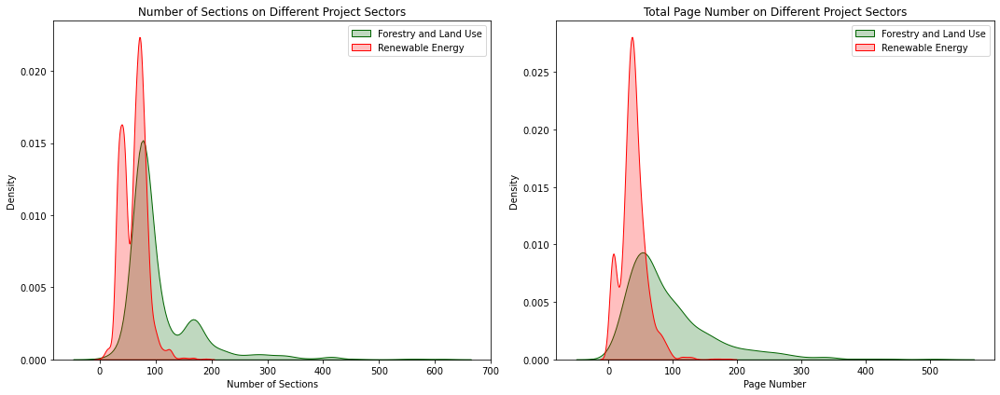

In [369]:
fig, axes = plt.subplots(1, 2, figsize=(15, 6), sharey=False)

sns.kdeplot(project_level[project_level['Project Sector'] == 'Forestry and Land Use']['number_of_sections'], label='Forestry and Land Use', shade=True, color='darkgreen', ax=axes[0])
sns.kdeplot(project_level[project_level['Project Sector'] == 'Renewable Energy']['number_of_sections'], label='Renewable Energy', shade=True, color='red', ax=axes[0])

axes[0].set_xlabel('Number of Sections')
axes[0].set_ylabel('Density')
axes[0].set_title('Number of Sections on Different Project Sectors')
axes[0].legend()


sns.kdeplot(project_level[project_level['Project Sector'] == 'Forestry and Land Use']['page_number'], label='Forestry and Land Use', shade=True, color='darkgreen', ax=axes[1])
sns.kdeplot(data=project_level[project_level['Project Sector'] == 'Renewable Energy']['page_number'], label='Renewable Energy', shade=True, color='red', ax=axes[1])

axes[1].set_xlabel('Page Number')
axes[1].set_ylabel('Density')
axes[1].set_title('Total Page Number on Different Project Sectors')
axes[1].legend()

# Adjust layout
plt.tight_layout()
plt.show()

C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_19540\1244192875.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['Project Registration Year'] = filtered_df['Project Registration Year'].astype('int')


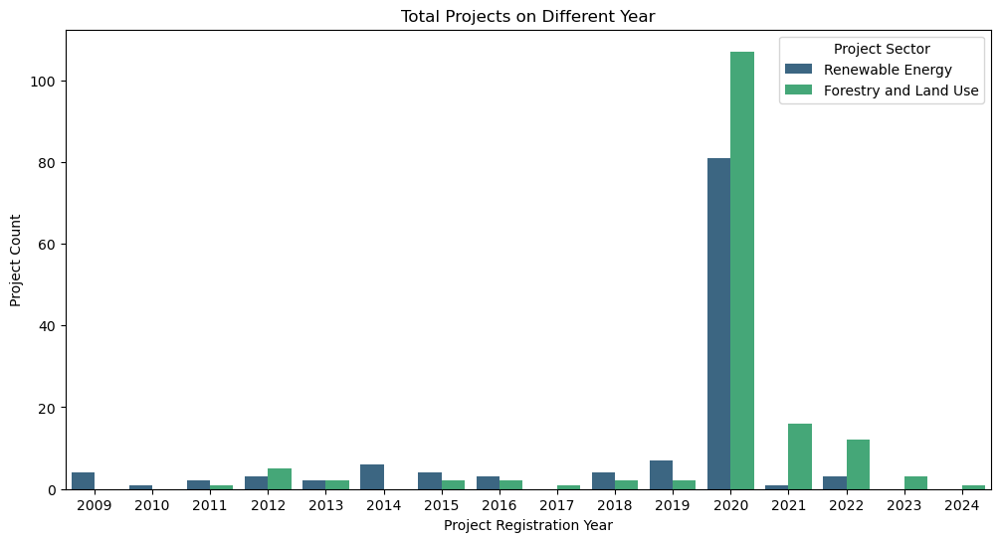

In [47]:
filtered_df = toc[~toc['Project Registration Year'].isna()]

filtered_df['Project Registration Year'] = filtered_df['Project Registration Year'].astype('int')
df_counts = filtered_df.groupby(['Project Registration Year', 'Project Sector'])['id'].nunique().reset_index()
df_counts.columns = ['Project Registration Year', 'Project Sector', 'Unique ID Count']

plt.figure(figsize=(12, 6))
sns.barplot(data=df_counts, x='Project Registration Year', y='Unique ID Count', hue='Project Sector', palette='viridis')

plt.xlabel('Project Registration Year')
plt.ylabel('Project Count')
plt.title('Total Projects on Different Year')

plt.legend(title='Project Sector')
plt.show()

#### Forestry and Land Use projects tend to have more sections and pages in their PDDS.

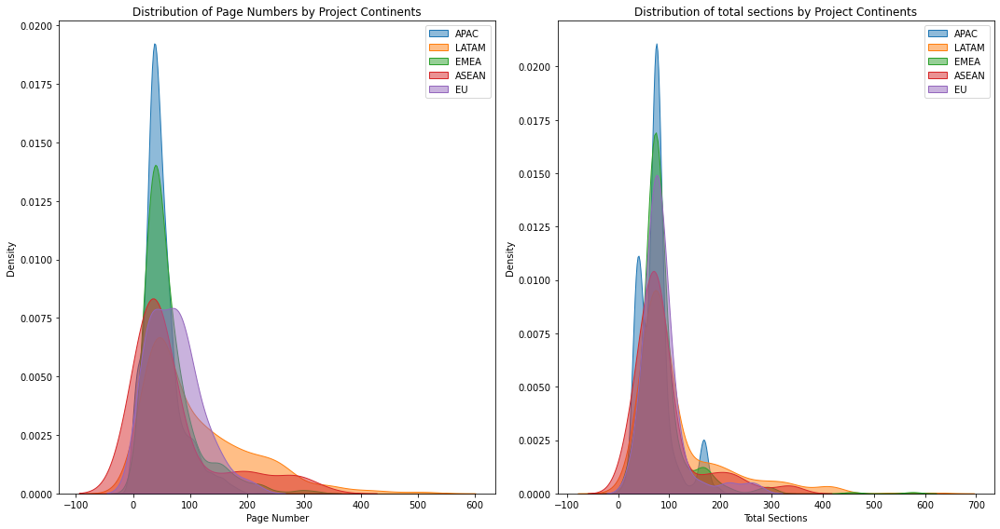

In [387]:
fig, axes = plt.subplots(1, 2, figsize=(15, 8), sharey=False)

for country in project_level['Project Region'].unique():
    sns.kdeplot(
        project_level[project_level['Project Region'] == country]['page_number'],
        label=country,
        shade=True,
        alpha=0.5, ax=axes[0])
    
    sns.kdeplot(
        project_level[project_level['Project Region'] == country]['number_of_sections'],
        label=country,
        shade=True,
        alpha=0.5, ax=axes[1])

axes[0].set_xlabel('Page Number')
axes[0].set_ylabel('Density')
axes[0].set_title('Distribution of Page Numbers by Project Continents')
axes[0].legend()

axes[1].set_xlabel('Total Sections')
axes[1].set_ylabel('Density')
axes[1].set_title('Distribution of total sections by Project Continents')
axes[1].legend()

plt.tight_layout()
plt.show()

#### No significant patterns were observed across different regions.

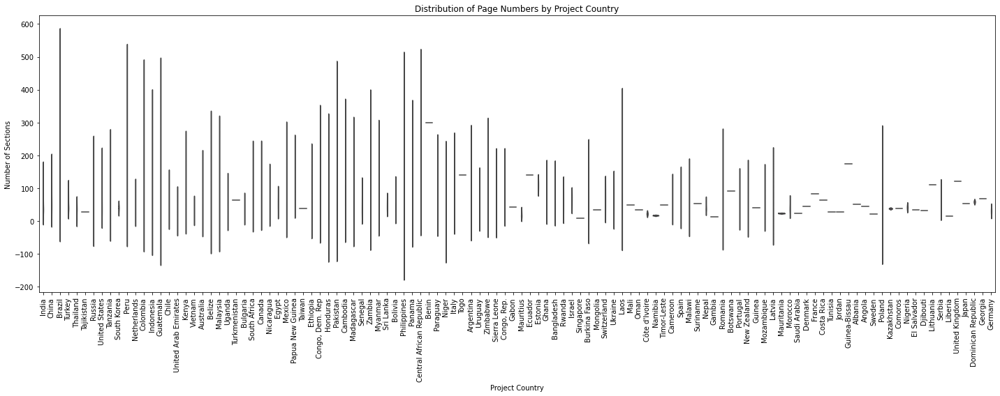

In [371]:
plt.figure(figsize=(20, 8))


sns.violinplot(x='Project Country', y='page_number', data=project_level, inner='quartile')

plt.xlabel('Project Country')
plt.ylabel('Number of Sections')
plt.title('Distribution of Page Numbers by Project Country')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

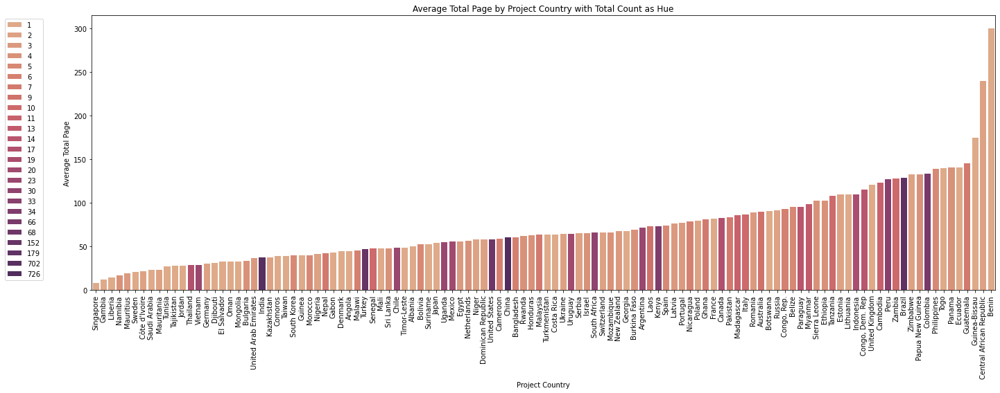

In [372]:
country_counts = project_level.groupby('Project Country').agg(
    Average_page=('page_number', 'mean'),
    Total_Count=('id', 'count')
).reset_index()

country_counts = country_counts.sort_values(by='Average_page', ascending=True)

plt.figure(figsize=(20, 8))
ax = sns.barplot(x='Project Country', y='Average_page', data=country_counts, hue='Total_Count', palette='flare', dodge=False)

plt.xlabel('Project Country')
plt.ylabel('Average Total Page')
plt.title('Average Total Page by Project Country with Total Count as Hue')
plt.xticks(rotation=90)
    
ax.legend(bbox_to_anchor=(-0.05, 1))

plt.tight_layout()
plt.show()

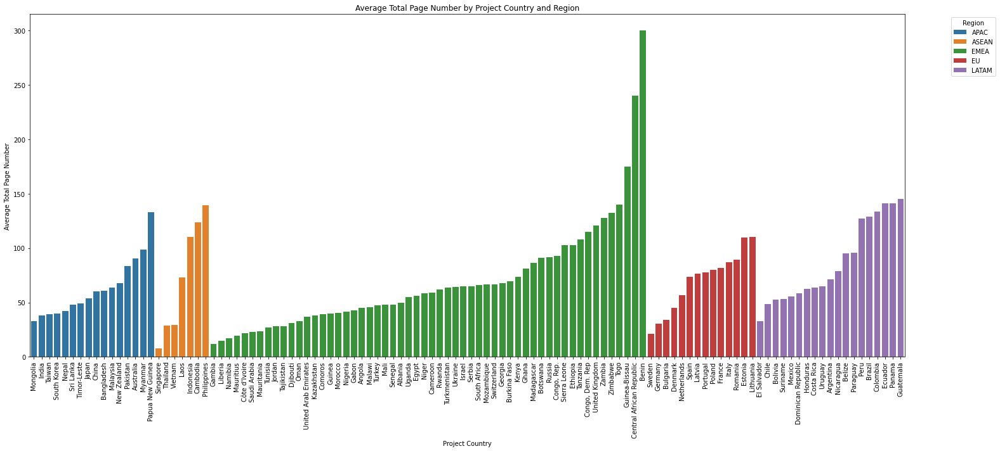

In [373]:
country_counts = project_level.groupby(['Project Country', 'Project Region'])['page_number'].mean().reset_index()
country_counts.columns = ['Project Country', 'Project Region', 'Average Total Page Number']

country_counts = country_counts.sort_values(by=['Project Region', 'Average Total Page Number'], ascending=True)

plt.figure(figsize=(20, 10))

sns.barplot(x='Project Country', y='Average Total Page Number', data=country_counts, hue='Project Region', dodge=False)

plt.xlabel('Project Country')
plt.ylabel('Average Total Page Number')
plt.title('Average Total Page Number by Project Country and Region')
plt.xticks(rotation=90)
plt.tight_layout()
plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [374]:
project_level[project_level['Project Country']=='Benin']

,id,Project Sector,Project Country,Project Methodologies,Project Region,Project Continent,number_of_sections,page_number
40554,2538,Forestry and Land Use,Benin,"Methodology for Avoided Ecosystem Conversion, ...",EMEA,Africa,160,300


In [375]:
project_level[project_level['Project Country']=='Central African Republic']

,id,Project Sector,Project Country,Project Methodologies,Project Region,Project Continent,number_of_sections,page_number
40043,2510,Forestry and Land Use,Central African Republic,"Methodology for Avoided Ecosystem Conversion, ...",EMEA,Africa,161,322
202572,3815,Forestry and Land Use,Central African Republic,AR-ACM0003 Afforestation and reforestation of ...,EMEA,Africa,86,158


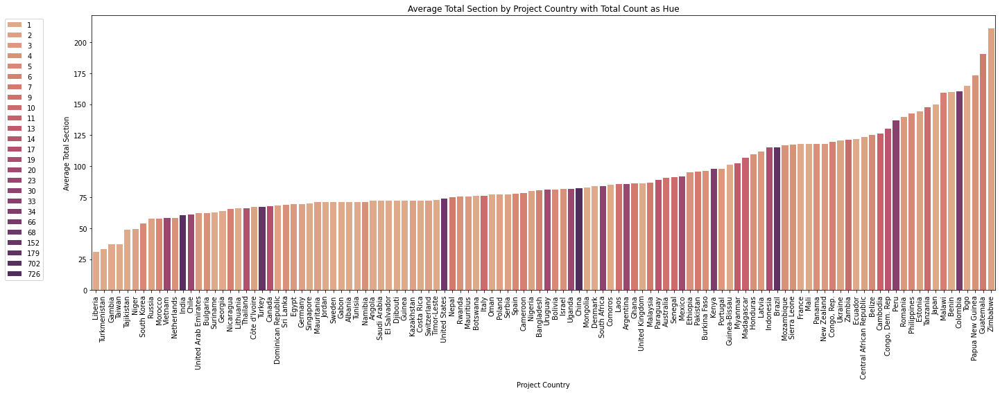

In [376]:
country_counts = project_level.groupby('Project Country').agg(
    Average_Total_Section=('number_of_sections', 'mean'),
    Total_Count=('number_of_sections', 'count')
).reset_index()

country_counts = country_counts.sort_values(by='Average_Total_Section', ascending=True)

plt.figure(figsize=(20, 8))
ax = sns.barplot(x='Project Country', y='Average_Total_Section', data=country_counts, hue='Total_Count', palette='flare', dodge=False)

plt.xlabel('Project Country')
plt.ylabel('Average Total Section')
plt.title('Average Total Section by Project Country with Total Count as Hue')
plt.xticks(rotation=90)

ax.legend(bbox_to_anchor=(-0.05, 1))

plt.tight_layout()
plt.show()

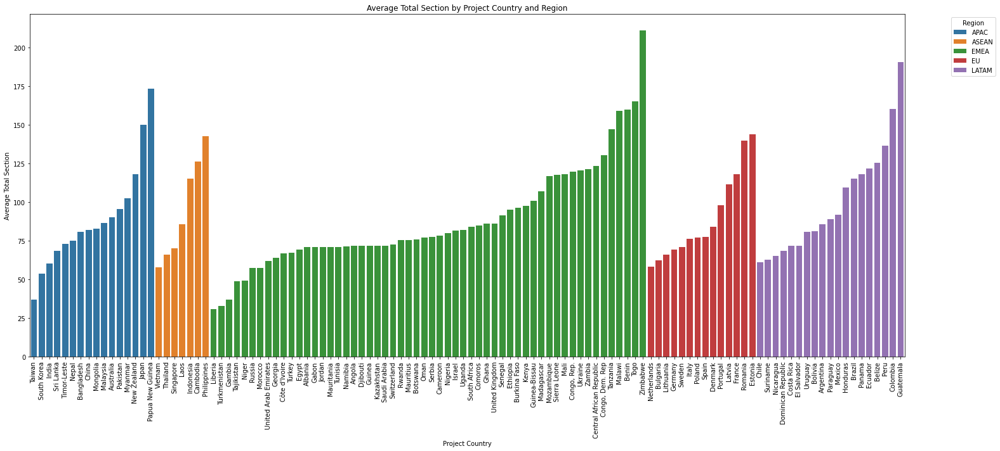

In [377]:
country_counts = project_level.groupby(['Project Country', 'Project Region'])['number_of_sections'].mean().reset_index()
country_counts.columns = ['Project Country', 'Project Region', 'Average Total Section']

country_counts = country_counts.sort_values(by=['Project Region', 'Average Total Section'], ascending=True)

plt.figure(figsize=(20, 10))

sns.barplot(x='Project Country', y='Average Total Section', data=country_counts, hue='Project Region', dodge=False)

plt.xlabel('Project Country')
plt.ylabel('Average Total Section')
plt.title('Average Total Section by Project Country and Region')
plt.xticks(rotation=90)
plt.tight_layout()
plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

#### Filter Country with more than 10 projects

In [49]:
country_counts = project_level.groupby('Project Country').agg(Total_Count=('id', 'count')).reset_index()
filtered_country = country_counts[country_counts['Total_Count'] > 5]
filtered_project = project_level[project_level['Project Country'].isin(filtered_country['Project Country'].to_list())]

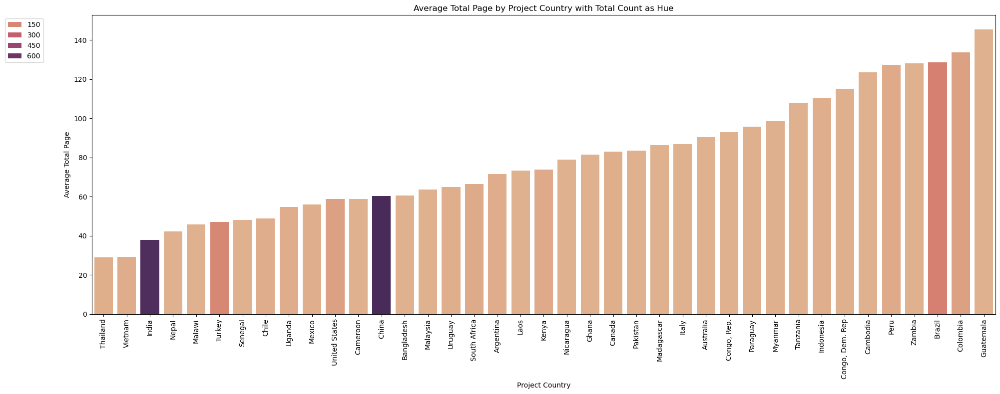

In [50]:
country_counts = filtered_project.groupby('Project Country').agg(
    Average_page=('page_number', 'mean'),
    Total_Count=('id', 'count')
).reset_index()

country_counts = country_counts.sort_values(by='Average_page', ascending=True)

plt.figure(figsize=(20, 8))
ax = sns.barplot(x='Project Country', y='Average_page', data=country_counts, hue='Total_Count', palette='flare', dodge=False)

plt.xlabel('Project Country')
plt.ylabel('Average Total Page')
plt.title('Average Total Page by Project Country with Total Count as Hue')
plt.xticks(rotation=90)
    
ax.legend(bbox_to_anchor=(-0.05, 1))

plt.tight_layout()
plt.show()

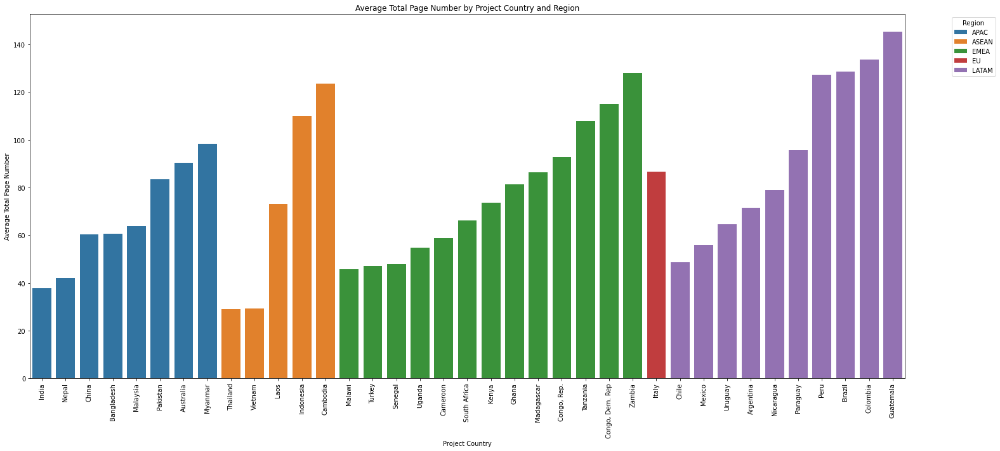

In [380]:
country_counts = filtered_project.groupby(['Project Country', 'Project Region'])['page_number'].mean().reset_index()
country_counts.columns = ['Project Country', 'Project Region', 'Average Total Page Number']

country_counts = country_counts.sort_values(by=['Project Region', 'Average Total Page Number'], ascending=True)

plt.figure(figsize=(20, 10))

sns.barplot(x='Project Country', y='Average Total Page Number', data=country_counts, hue='Project Region', dodge=False)

plt.xlabel('Project Country')
plt.ylabel('Average Total Page Number')
plt.title('Average Total Page Number by Project Country and Region')
plt.xticks(rotation=90)
plt.tight_layout()
plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

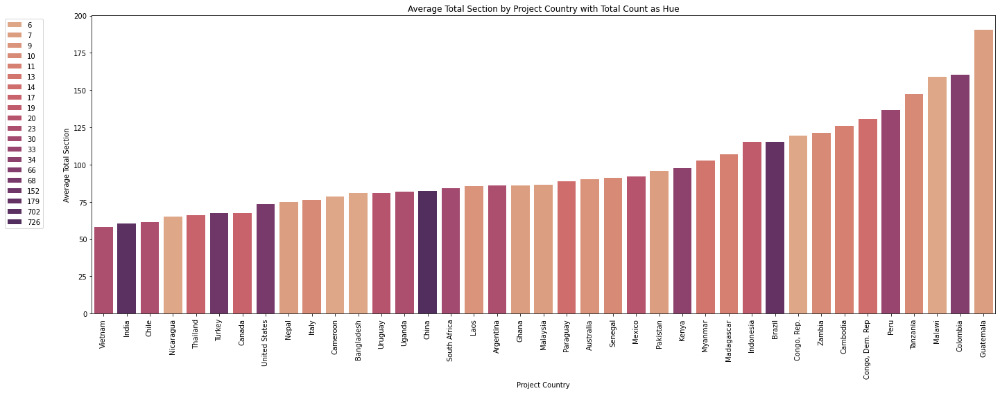

In [381]:
country_counts = filtered_project.groupby('Project Country').agg(
    Average_Total_Section=('number_of_sections', 'mean'),
    Total_Count=('number_of_sections', 'count')
).reset_index()

country_counts = country_counts.sort_values(by='Average_Total_Section', ascending=True)

plt.figure(figsize=(20, 8))
ax = sns.barplot(x='Project Country', y='Average_Total_Section', data=country_counts, hue='Total_Count', palette='flare', dodge=False)

plt.xlabel('Project Country')
plt.ylabel('Average Total Section')
plt.title('Average Total Section by Project Country with Total Count as Hue')
plt.xticks(rotation=90)

ax.legend(bbox_to_anchor=(-0.05, 1))

plt.tight_layout()
plt.show()

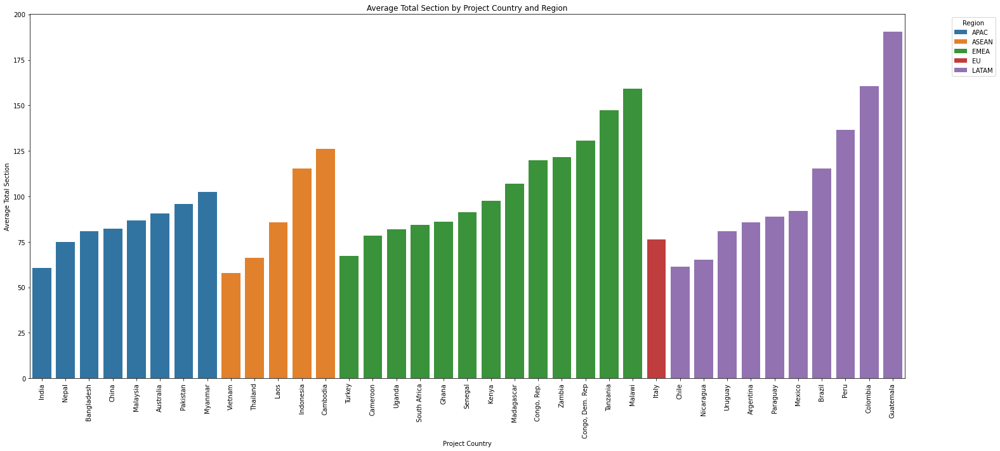

In [382]:
country_counts = filtered_project.groupby(['Project Country', 'Project Region'])['number_of_sections'].mean().reset_index()
country_counts.columns = ['Project Country', 'Project Region', 'Average Total Section']

country_counts = country_counts.sort_values(by=['Project Region', 'Average Total Section'], ascending=True)

plt.figure(figsize=(20, 10))

sns.barplot(x='Project Country', y='Average Total Section', data=country_counts, hue='Project Region', dodge=False)

plt.xlabel('Project Country')
plt.ylabel('Average Total Section')
plt.title('Average Total Section by Project Country and Region')
plt.xticks(rotation=90)
plt.tight_layout()
plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [51]:
country_counts = project_level.groupby('Project Country').agg(Total_Count=('id', 'count')).reset_index()
filtered_country = country_counts[country_counts['Total_Count'] > 20]
filtered_project = project_level[project_level['Project Country'].isin(filtered_country['Project Country'].to_list())]

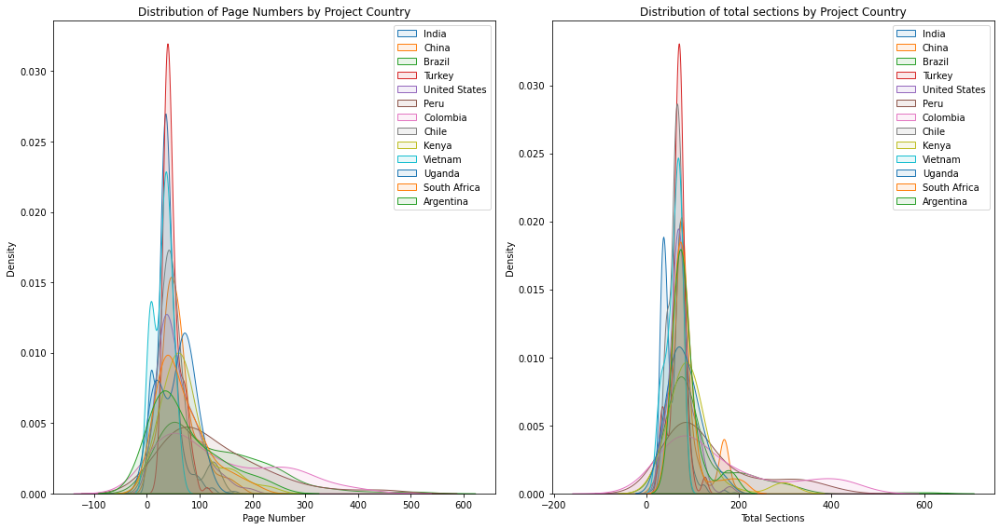

In [384]:
fig, axes = plt.subplots(1, 2, figsize=(15, 8), sharey=False)

for country in filtered_project['Project Country'].unique():
    sns.kdeplot(
        filtered_project[filtered_project['Project Country'] == country]['page_number'],
        label=country,
        shade=True,
        alpha=0.1, ax=axes[0])
    
    sns.kdeplot(
        filtered_project[filtered_project['Project Country'] == country]['number_of_sections'],
        label=country,
        shade=True,
        alpha=0.1, ax=axes[1])

axes[0].set_xlabel('Page Number')
axes[0].set_ylabel('Density')
axes[0].set_title('Distribution of Page Numbers by Project Country')
axes[0].legend()

axes[1].set_xlabel('Total Sections')
axes[1].set_ylabel('Density')
axes[1].set_title('Distribution of total sections by Project Country')
axes[1].legend()

plt.tight_layout()
plt.show()

In [52]:
filtered_project

,id,Project Sector,Project Country,Project Methodologies,Project Region,Project Continent,number_of_sections,page_number
0,1,Renewable Energy,India,AMS-I.D. Grid connected renewable electricity ...,APAC,Asia,62,34
62,6,Renewable Energy,China,ACM0002 Grid-connected electricity generation ...,APAC,Asia,44,36
106,7,Renewable Energy,China,ACM0002 Grid-connected electricity generation ...,APAC,Asia,44,36
150,8,Renewable Energy,India,AMS-I.D. Grid connected renewable electricity ...,APAC,Asia,32,4
182,12,Renewable Energy,China,ACM0002 Grid-connected electricity generation ...,APAC,Asia,840,47
...,...,...,...,...,...,...,...,...
2647255,918,Renewable Energy,Turkey,ACM0002 Grid-connected electricity generation ...,EMEA,Asia,61,44
2647316,927,Renewable Energy,India,AMS-I.D. Grid connected renewable electricity ...,APAC,Asia,81,31
2647397,92,Renewable Energy,India,ACM0002 Grid-connected electricity generation ...,APAC,Asia,6400,39
2653797,958,Forestry and Land Use,Peru,Methodology for Avoided Unplanned Deforestatio...,LATAM,South America,12180,153


C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_19540\2748744845.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(
C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_19540\2748744845.py:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(
C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_19540\2748744845.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(
C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_19540\2748744845.py:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

 

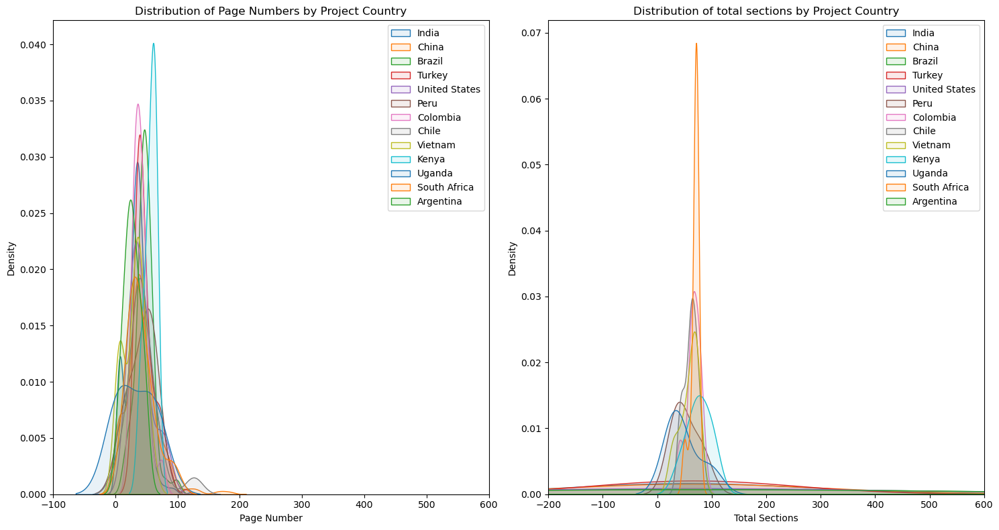

In [56]:
fig, axes = plt.subplots(1, 2, figsize=(15, 8), sharey=False)

en = filtered_project[filtered_project['Project Sector']=='Renewable Energy']
for country in en['Project Country'].unique():
    sns.kdeplot(
        en[en['Project Country'] == country]['page_number'],
        label=country,
        shade=True,
        alpha=0.1, ax=axes[0])
    
    sns.kdeplot(
        en[en['Project Country'] == country]['number_of_sections'],
        label=country,
        shade=True,
        alpha=0.1, ax=axes[1])

axes[0].set_xlim(-100, 600)
axes[1].set_xlim(-200, 600)

axes[0].set_xlabel('Page Number')
axes[0].set_ylabel('Density')
axes[0].set_title('Distribution of Page Numbers by Project Country')
axes[0].legend()

axes[1].set_xlabel('Total Sections')
axes[1].set_ylabel('Density')
axes[1].set_title('Distribution of total sections by Project Country')
axes[1].legend()

plt.tight_layout()
plt.show()

C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_19540\1829229610.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(
C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_19540\1829229610.py:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(
C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_19540\1829229610.py:5: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(
C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_19540\1829229610.py:11: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

 

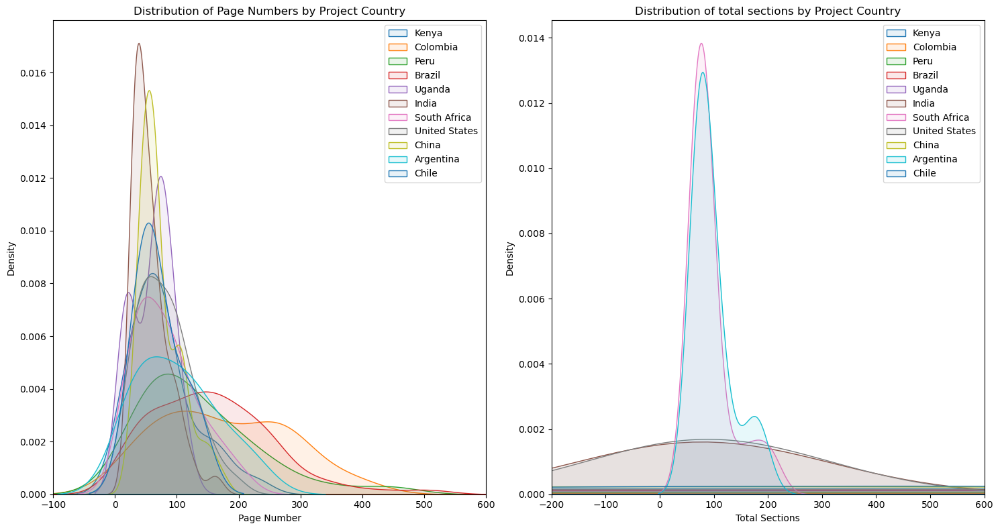

In [57]:
fig, axes = plt.subplots(1, 2, figsize=(15, 8), sharey=False)

en = filtered_project[filtered_project['Project Sector']=='Forestry and Land Use']
for country in en['Project Country'].unique():
    sns.kdeplot(
        en[en['Project Country'] == country]['page_number'],
        label=country,
        shade=True,
        alpha=0.1, ax=axes[0])
    
    sns.kdeplot(
        en[en['Project Country'] == country]['number_of_sections'],
        label=country,
        shade=True,
        alpha=0.1, ax=axes[1])

axes[0].set_xlim(-100, 600)
axes[1].set_xlim(-200, 600)

axes[0].set_xlabel('Page Number')
axes[0].set_ylabel('Density')
axes[0].set_title('Distribution of Page Numbers by Project Country')
axes[0].legend()

axes[1].set_xlabel('Total Sections')
axes[1].set_ylabel('Density')
axes[1].set_title('Distribution of total sections by Project Country')
axes[1].legend()

plt.tight_layout()
plt.show()

#### Columbia, Brazil, and Peru tends to have longer pages and cover more sections.

## 2. Are all the defined keywords sufficient for extracting relevant sections?

##### 1. proponents

Project 562/1429 lack of the headings format, not able to extract

Project 2403/1748 some part of text (section number) are embeded in the PDF, cannot be detected as text

In [27]:
project_proponents = [
    "projectproponent",
    "nameofperson",
    "participants",
    "proofoftitle",
#     "background",
    "supplierdata",
    "carbonoffsetdeveloper",
#     "description"
#     "objective",
    "ownership",
    "property"
]

pattern = '|'.join(project_proponents)

matched_proponent = toc[toc['toc'].str.replace(" ", "").str.lower().str.contains(pattern)]

In [28]:
toc.loc[toc['id'].isin(matched_proponent['id'].tolist()), 'Section'] = 'Project Proponent'

In [29]:
matched_proponent.id.nunique()

2521

In [30]:
toc[~toc['id'].isin(matched_proponent.id)].id.unique()

array([ 138,  562, 1429, 1748, 1887, 2403, 2965, 3002], dtype=int64)

In [31]:
toc[toc['id']==562]['toc'].unique()

array(['8.1 Estimating Emissions from Above Ground Large Tree Biomass ............................................. 52',
       '8.2 Estimating Emissions from Above Ground Small Tree Biomass ............................................. 52',
       '8.3 Estimating Emissions from Above Ground Non-Tree Biomass................................................ 52',
       '8.4 Estimating Emissions from Below Ground Large Tree Biomass ............................................. 52',
       '8.5 Estimating Emissions from Below Ground Small Tree Biomass ............................................. 53',
       '8.6 Estimating Emissions from Below Ground Non-Tree Biomass ................................................ 53',
       '8.7 Estimating Emissions from Standing Dead Wood ..................................................................... 53',
       '8.8 Estimating Emissions from Lying Dead Wood ........................................................................... 53',
      

In [32]:
no_proponent = toc[toc['id'].isin(toc[~toc['id'].isin(matched_proponent.id)].id.unique())]
no_proponent[no_proponent['toc'].str.lower().str.contains('proponent')]

,toc,page,id,filename,next_section_page,section_number,section,Registry,Project Sector,Project Country,Project Methodologies,Project Region,Project Continent,Project Registration Year,Project Life Time,Section


#### No any word related to proponent

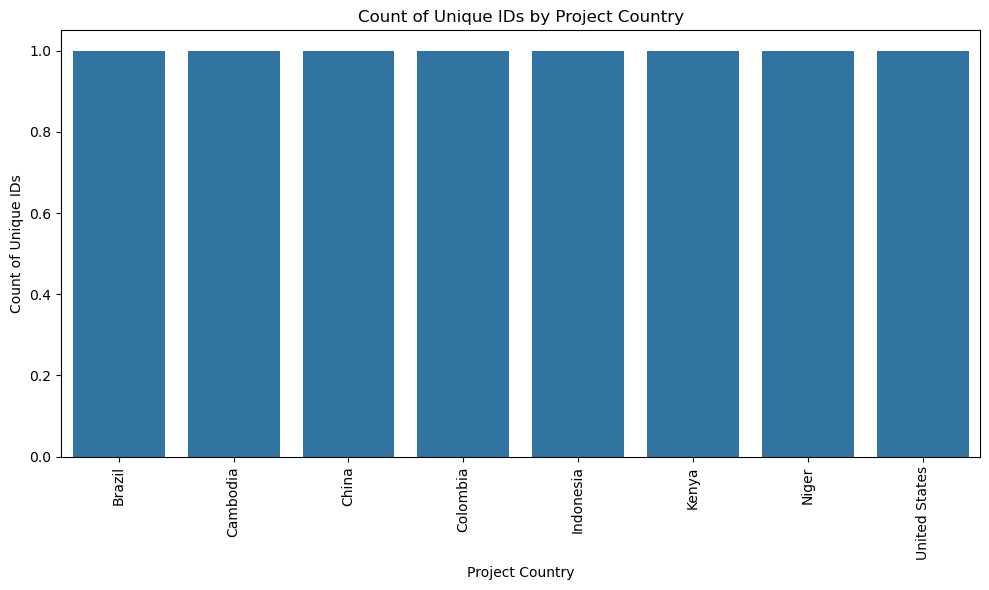

In [33]:
no_proponent = toc[toc['id'].isin(toc[~toc['id'].isin(matched_proponent.id)].id.unique())]
total_counts = toc.groupby('Project Country')['id'].nunique().reset_index()
country_counts = no_proponent.groupby('Project Country')['id'].nunique().reset_index()
country_counts.columns = ['Project Country', 'Unique ID Count']

plt.figure(figsize=(10, 6))
sns.barplot(x='Project Country', y='Unique ID Count', data=country_counts)
plt.title('Count of Unique IDs by Project Country')
plt.xlabel('Project Country')
plt.ylabel('Count of Unique IDs')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

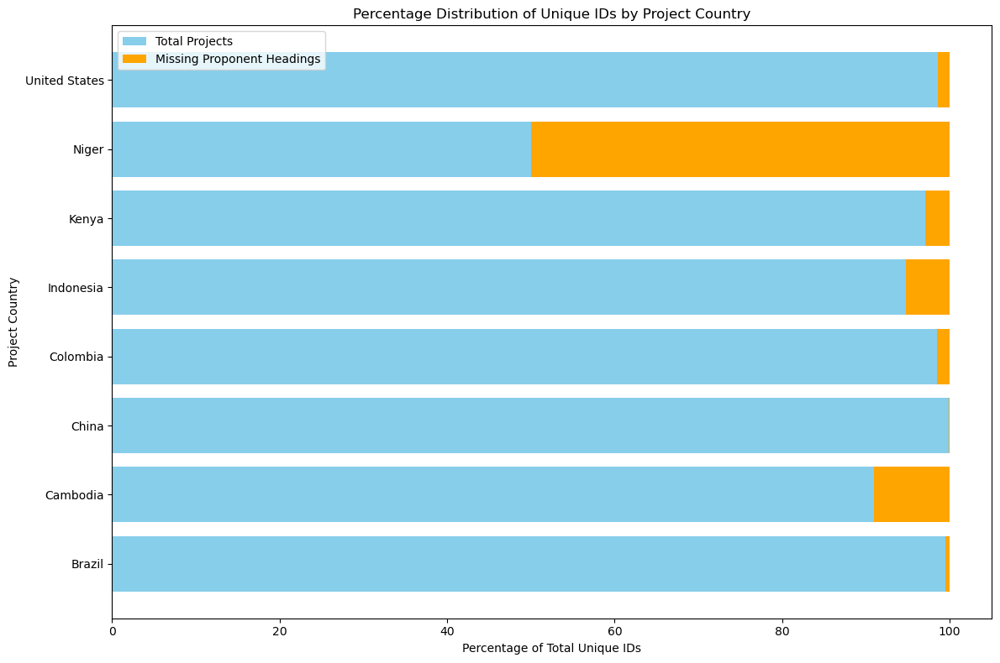

In [34]:
full_counts = toc.groupby('Project Country')['id'].nunique().reset_index()
full_counts.columns = ['Project Country', 'Unique ID Count (Full)']

filtered_counts = no_proponent.groupby('Project Country')['id'].nunique().reset_index()
filtered_counts.columns = ['Project Country', 'Unique ID Count (Filtered)']

merged_counts = pd.merge(full_counts, filtered_counts, on='Project Country', how='right')
merged_counts.fillna(0, inplace=True)

merged_counts['Percentage (Filtered)'] = (merged_counts['Unique ID Count (Filtered)'] / merged_counts['Unique ID Count (Full)']) * 100
merged_counts['Percentage (Remaining)'] = 100 - merged_counts['Percentage (Filtered)']

plot_data = merged_counts.set_index('Project Country')[['Percentage (Remaining)', 'Percentage (Filtered)']]

plt.figure(figsize=(12, 8))

bars_remaining = plt.barh(plot_data.index, plot_data['Percentage (Remaining)'], label='Total Projects', color='skyblue')
bars_filtered = plt.barh(plot_data.index, plot_data['Percentage (Filtered)'], 
                         left=plot_data['Percentage (Remaining)'], label='Missing Proponent Headings', color='orange')

plt.title('Percentage Distribution of Unique IDs by Project Country')
plt.xlabel('Percentage of Total Unique IDs')
plt.ylabel('Project Country')
plt.legend()
plt.tight_layout()

plt.show()

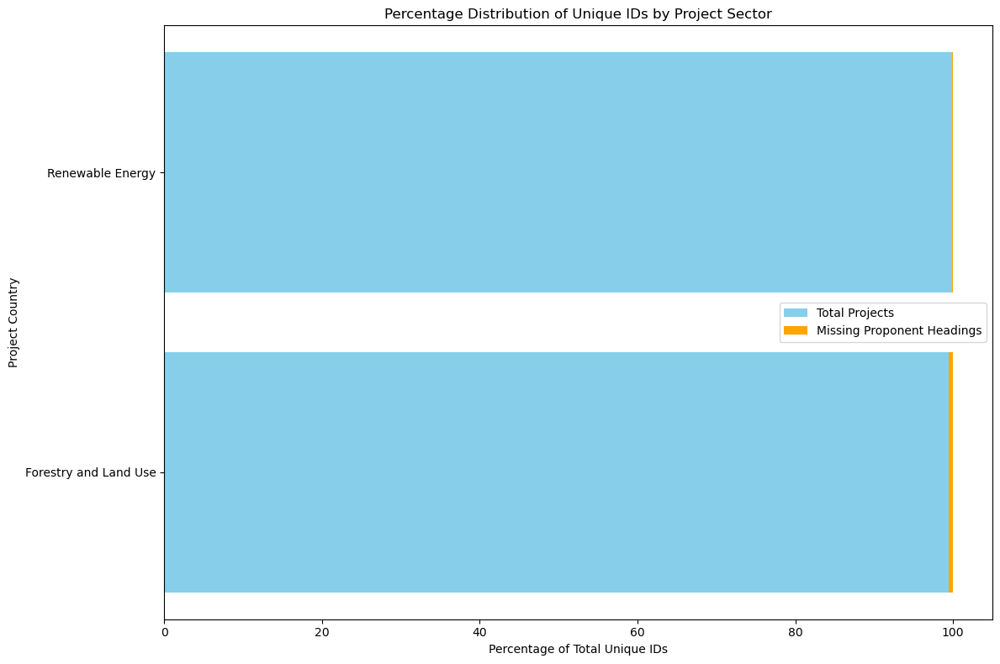

In [35]:
full_counts = toc.groupby('Project Sector')['id'].nunique().reset_index()
full_counts.columns = ['Project Sector', 'Unique ID Count (Full)']

filtered_counts = no_proponent.groupby('Project Sector')['id'].nunique().reset_index()
filtered_counts.columns = ['Project Sector', 'Unique ID Count (Filtered)']

merged_counts = pd.merge(full_counts, filtered_counts, on='Project Sector', how='right')
merged_counts.fillna(0, inplace=True)

merged_counts['Percentage (Filtered)'] = (merged_counts['Unique ID Count (Filtered)'] / merged_counts['Unique ID Count (Full)']) * 100
merged_counts['Percentage (Remaining)'] = 100 - merged_counts['Percentage (Filtered)']

plot_data = merged_counts.set_index('Project Sector')[['Percentage (Remaining)', 'Percentage (Filtered)']]

plt.figure(figsize=(12, 8))

bars_remaining = plt.barh(plot_data.index, plot_data['Percentage (Remaining)'], label='Total Projects', color='skyblue')
bars_filtered = plt.barh(plot_data.index, plot_data['Percentage (Filtered)'], 
                         left=plot_data['Percentage (Remaining)'], label='Missing Proponent Headings', color='orange')

plt.title('Percentage Distribution of Unique IDs by Project Sector')
plt.xlabel('Percentage of Total Unique IDs')
plt.ylabel('Project Country')
plt.legend()
plt.tight_layout()

plt.show()

C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_9708\3354987779.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Project Country', y='Unique ID Count', data=sector_counts, ax=ax, palette='viridis')
C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_9708\3354987779.py:15: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_9708\3354987779.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x='Project Country', y='Unique ID Count', data=sector_counts, ax=ax, palette='viridis')


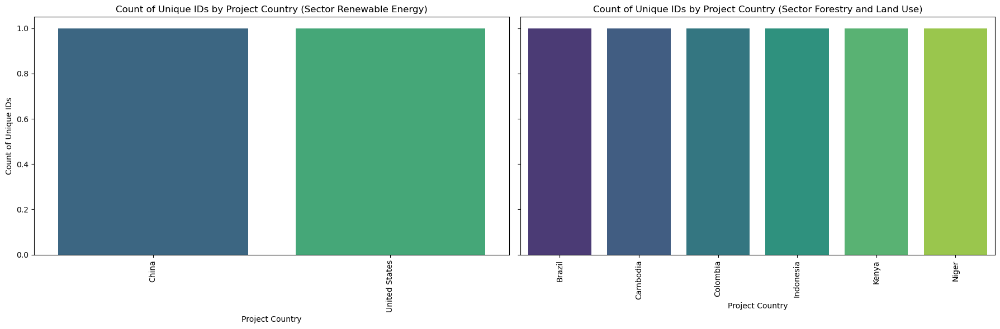

In [36]:
sectors = ['Renewable Energy', 'Forestry and Land Use']

fig, axes = plt.subplots(1, 2, figsize=(18, 6), sharey=True)

for sector, ax in zip(sectors, axes):
    sector_data = no_proponent[no_proponent['Project Sector'] == sector]

    sector_counts = sector_data.groupby('Project Country')['id'].nunique().reset_index()
    sector_counts.columns = ['Project Country', 'Unique ID Count']

    sns.barplot(x='Project Country', y='Unique ID Count', data=sector_counts, ax=ax, palette='viridis')
    ax.set_title(f'Count of Unique IDs by Project Country (Sector {sector})')
    ax.set_xlabel('Project Country')
    ax.set_ylabel('Count of Unique IDs')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

plt.tight_layout()

plt.show()

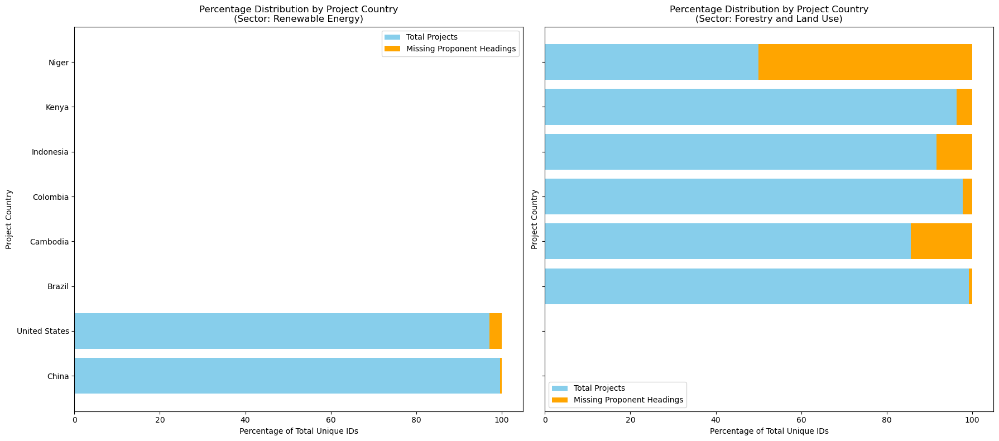

In [37]:
sectors = ['Renewable Energy', 'Forestry and Land Use']

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(18, 8), sharey=True)

for sector, ax in zip(sectors, axes):
    # Filter data for each sector
    sector_data = toc[toc['Project Sector'] == sector]
    no_proponent_sector = no_proponent[no_proponent['Project Sector'] == sector]

    # Calculate counts
    full_counts = sector_data.groupby('Project Country')['id'].nunique().reset_index()
    full_counts.columns = ['Project Country', 'Unique ID Count (Full)']

    filtered_counts = no_proponent_sector.groupby('Project Country')['id'].nunique().reset_index()
    filtered_counts.columns = ['Project Country', 'Unique ID Count (Filtered)']

    # Merge counts
    merged_counts = pd.merge(full_counts, filtered_counts, on='Project Country', how='right')
    merged_counts.fillna(0, inplace=True)

    # Calculate percentages
    merged_counts['Percentage (Filtered)'] = (merged_counts['Unique ID Count (Filtered)'] / merged_counts['Unique ID Count (Full)']) * 100
    merged_counts['Percentage (Remaining)'] = 100 - merged_counts['Percentage (Filtered)']

    # Prepare data for plotting
    plot_data = merged_counts.set_index('Project Country')[['Percentage (Remaining)', 'Percentage (Filtered)']]

    # Plot stacked bar chart for the sector
    bars_remaining = ax.barh(plot_data.index, plot_data['Percentage (Remaining)'], label='Total Projects', color='skyblue')
    bars_filtered = ax.barh(plot_data.index, plot_data['Percentage (Filtered)'], 
                           left=plot_data['Percentage (Remaining)'], label='Missing Proponent Headings', color='orange')

    ax.set_title(f'Percentage Distribution by Project Country\n(Sector: {sector})')
    ax.set_xlabel('Percentage of Total Unique IDs')
    ax.set_ylabel('Project Country')
    ax.legend()

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

#### Renewable Energy tends to lack of project proponent section. But, no obvious pattern involved countries

##### 2. emission reductions

In [38]:
ghg_emission_reductions = [
        "emissionreduction",
        "greenhousegasemissions",
        "emissionsreduction",
        "ghgemission",
        "greenhousegas",
        "projectactivity"
    ]

pattern = '|'.join(ghg_emission_reductions)

matched_emission_reductions = toc[toc['toc'].str.replace(" ", "").str.lower().str.contains(pattern)]

In [39]:
toc.loc[toc['id'].isin(matched_emission_reductions['id'].tolist()), 'Section'] = 'GHG Emission Reductions'

In [40]:
matched_emission_reductions.id.nunique()

2522

In [41]:
toc[~toc['id'].isin(matched_emission_reductions.id)].id.unique()

array([ 138,  562, 1429, 1748, 2403, 2965, 3002], dtype=int64)

In [42]:
no_ghg = toc[toc['id'].isin(toc[~toc['id'].isin(matched_emission_reductions.id)].id.unique())]

keywords = ['emission', 'carbon', 'greenhouse', 'ghg', 'reduction']

pattern = '|'.join(keywords)

no_ghg[no_ghg['toc'].str.lower().str.contains(pattern, regex=True)]['toc'].unique()

array(['8.1 Estimating Emissions from Above Ground Large Tree Biomass ............................................. 52',
       '8.2 Estimating Emissions from Above Ground Small Tree Biomass ............................................. 52',
       '8.3 Estimating Emissions from Above Ground Non-Tree Biomass................................................ 52',
       '8.4 Estimating Emissions from Below Ground Large Tree Biomass ............................................. 52',
       '8.5 Estimating Emissions from Below Ground Small Tree Biomass ............................................. 53',
       '8.6 Estimating Emissions from Below Ground Non-Tree Biomass ................................................ 53',
       '8.7 Estimating Emissions from Standing Dead Wood ..................................................................... 53',
       '8.8 Estimating Emissions from Lying Dead Wood ........................................................................... 53',
      

##### 3. methodology

In [43]:
methodology = [
        "applicabilityofmethodology",
        "applicabilityofmethodologies",
        "applicabilityofmethodologies",
        "applicabilityofthemethodology",
        "titleandreferenceofmethodology",
        "methodologyapplicability",
#         "information",
#         "category",
#         "description",
#         "design",
#         "boundary",
        "methodology",
        "methodologies"
    ]

pattern = '|'.join(methodology)

matched_methodology = toc[toc['toc'].str.replace(" ", "").str.lower().str.contains(pattern)]

In [44]:
toc.loc[toc['id'].isin(matched_methodology['id'].tolist()), 'Section'] = 'Methodologies'

In [45]:
matched_methodology.id.nunique()

2495

In [46]:
toc[~toc['id'].isin(matched_methodology.id)].id.unique()

array([  51,  104,  138,  334,  338,  562,  709,  789,  793,  798,  802,
        811,  950,  951,  980,  982, 1040, 1086, 1098, 1194, 1404, 1429,
       1433, 1441, 1445, 1448, 1453, 1490, 1748, 1887, 2403, 3002,  960,
        959], dtype=int64)

In [47]:
no_method = toc[toc['id'].isin(toc[~toc['id'].isin(matched_methodology.id)].id.unique())]

keywords = ['methodology', 'methodologies']

pattern = '|'.join(keywords)

no_method[no_method['toc'].str.lower().str.contains(pattern, regex=True)]['toc'].unique()

array([], dtype=object)

##### 4. project_description

In [48]:
project_desc = [
        "summarydescriptionoftheproject",
        "projectlocation",
        "additionalinformationrelevanttotheproject",
        "projectdescription",
        "information",
        "location",
        "summary"
    ]

pattern = '|'.join(project_desc)

matched_project_desc = toc[toc['toc'].str.replace(" ", "").str.lower().str.contains(pattern)]

In [49]:
toc.loc[toc['id'].isin(matched_project_desc['id'].tolist()), 'Section'] = 'Project Description'

In [50]:
matched_project_desc.id.nunique()

2521

In [51]:
toc[~toc['id'].isin(matched_project_desc.id)].id.unique()

array([  51,  562,  676, 1078, 1429, 1748, 2965, 3002], dtype=int64)

In [52]:
no_proj_desc = toc[toc['id'].isin(toc[~toc['id'].isin(matched_project_desc.id)].id.unique())]

keywords = ['location', 'description', 'information', 'summary']

pattern = '|'.join(keywords)

no_proj_desc[no_proj_desc['toc'].str.lower().str.contains(pattern, regex=True)]['toc'].unique()

array(['2.4 Description of the monitoring plan',
       'A.4. Technicaldescriptionoftheprojectactivity:',
       'B.5. DescriptionofhowtheanthropogenicemissionsofGHGbysourcesarereducedbelow',
       'B.7. Applicationofthemonitoringmethodologyanddescriptionofthemonitoringplan:',
       'B.7.2. Descriptionofthemonitoringplan:'], dtype=object)

In [53]:
toc[toc['toc'].str.contains('SSummary Deescription oof the Projecct')]

,toc,page,id,filename,next_section_page,section_number,section,Registry,Project Sector,Project Country,Project Methodologies,Project Region,Project Continent,Project Registration Year,Project Life Time,Section
101934,1.1 SSummary Deescription oof the Projecct,2,791,791_01_vcs_pd_khandke_ii.pdf,2,1.1,1,Verra,Renewable Energy,India,ACM0002 Grid-connected electricity generation ...,APAC,Asia,NaN,NaN,Project Description
121649,1.1 SSummary Deescription oof the Projecct,2,907,907_vcs_pd_baicheng.pdf,3,1.1,1,Verra,Renewable Energy,China,AMS-I.C. Thermal energy production with or wit...,APAC,Asia,NaN,NaN,Project Description


##### 5. Credit Period

In [54]:
credit_period = [
        "creditingperiod",
        "projectcreditperiod",
        "credit",
        "category",
        "boundary",
        "netimpact"
    ]

pattern = '|'.join(credit_period)

matched_credit_period = toc[toc['toc'].str.replace(" ", "").str.lower().str.contains(pattern)]

In [55]:
toc.loc[toc['id'].isin(matched_credit_period['id'].tolist()), 'Section'] = 'Credit Period'

In [56]:
matched_credit_period.id.nunique()

2522

In [57]:
toc[~toc['id'].isin(matched_credit_period.id)].id.unique()

array([  51,  138,  562, 1429, 1748, 2403, 3002], dtype=int64)

In [58]:
no_credit = toc[toc['id'].isin(toc[~toc['id'].isin(matched_credit_period.id)].id.unique())]

keywords = ['credit']

pattern = '|'.join(keywords)

no_credit[no_credit['toc'].str.lower().str.contains(pattern, regex=True)]['toc'].unique()

array([], dtype=object)

##### 6. sector

In [59]:
sector = [
        "scopeandprojecttype",
        "sectoralscopeandtypeofproject",
        "sectoralscope",
        "sectorscopeandtypeofproject",
        "sectoraltypeandtypeofproject"
        "category",
        "categories",
#         "information",
#         "boundary",
#         "boundaries"
    ]

pattern = '|'.join(sector)

matched_sector = toc[toc['toc'].str.replace(" ", "").str.lower().str.contains(pattern)]

In [60]:
toc.loc[toc['id'].isin(matched_sector['id'].tolist()), 'Section'] = 'Sector'

In [61]:
matched_sector.id.nunique()

1975

In [62]:
toc[~toc['id'].isin(matched_sector.id)].id.unique()

array([   1,    6,    7,    8,   12,   26,   33,   34,   36,   37,   40,
         48,   49,   51,   52,   54,   56,   64,   66,   67,   69,   71,
         72,   73,   75,   76,   78,   83,   84,   89,   90,   91,   95,
         96,   97,   98,   99,  100,  101,  102,  103,  104,  105,  106,
        109,  110,  111,  114,  120,  121,  122,  123,  130,  131,  132,
        133,  134,  136,  137,  138,  139,  142,  145,  147,  148,  150,
        152,  153,  154,  158,  164,  166,  168,  174,  175,  180,  191,
        192,  195,  198,  201,  202,  225,  234,  235,  236,  237,  239,
        240,  244,  245,  248,  249,  250,  251,  253,  254,  255,  257,
        259,  260,  261,  263,  264,  265,  266,  267,  268,  269,  270,
        271,  273,  275,  287,  288,  289,  295,  298,  299,  300,  301,
        302,  304,  305,  306,  308,  309,  310,  311,  314,  315,  316,
        317,  321,  324,  331,  333,  334,  338,  339,  343,  344,  345,
        347,  348,  351,  357,  358,  359,  360,  3

In [63]:
no_sector = toc[toc['id'].isin(toc[~toc['id'].isin(matched_sector.id)].id.unique())]

keywords = ['scope', 'projecttype', 'sector']

pattern = '|'.join(keywords)

no_sector[no_sector['toc'].str.lower().str.contains(pattern, regex=True)]['toc'].unique()

array(['0.34 km2 vegetation will be cleared. There are virtually no trees within the scope of the windfarm,',
       '1.0 Scope and Application.',
       '1.2 Central Sector 5230.00 20700.00 0.00 0.00 4329.00 2720.00 32979.00',
       '1.2 Central Sector 5230.00 20700.0 0.00 0.00 4329.00 2720.0 32979.00',
       '3.5 Electricity Sector ......................................................................................................................... 7',
       '3.5 ELECTRICITY SECTOR',
       '1.2 Sectoral Scoope and Projeect Type ..................................................................................................... 3',
       '1.2 SSectoral Scoope and Prooject Type',
       '1.2 Sectoral SScope and PProject Typee ...................................................................................... 4',
       '1.2 Sectoral Sccope and Prooject Type ................................................................................................... 6',
       '1.2 SS

### 3. What are the typical sections (e.g., 1.1.2 Project Detail) and the usual page ranges and percentages for each question? Do these trends vary by country or sector?

In [64]:
matched_proponent['Section'] = 'Project Proponent'
matched_emission_reductions['Section'] = 'GHG Emission Reductions'
matched_methodology['Section'] = 'Methodologies'
matched_project_desc['Section'] = 'Project Proponent'
matched_credit_period['Section'] = 'Credit Period'
matched_sector['Section'] = 'Sector'


dfs = [matched_proponent, 
       matched_emission_reductions, 
       matched_methodology, 
       matched_project_desc, 
       matched_credit_period, 
       matched_sector]

stacked_df = pd.concat(dfs, axis=0, ignore_index=True)

C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_9708\3794132663.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  matched_proponent['Section'] = 'Project Proponent'
C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_9708\3794132663.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  matched_emission_reductions['Section'] = 'GHG Emission Reductions'
C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_9708\3794132663.py:3: SettingWithCopyWarning: 
A value is trying to be set on a c

In [65]:
stacked_df = stacked_df[stacked_df['section']!='0']
mapping_dict = {chr(i): i - 64 for i in range(65, 91)}

def map_alphabet_to_digit(value):
    if isinstance(value, str) and value.isalpha():
        return mapping_dict.get(value, value)
    return value

stacked_df['section'] = stacked_df['section'].apply(map_alphabet_to_digit).astype('str')

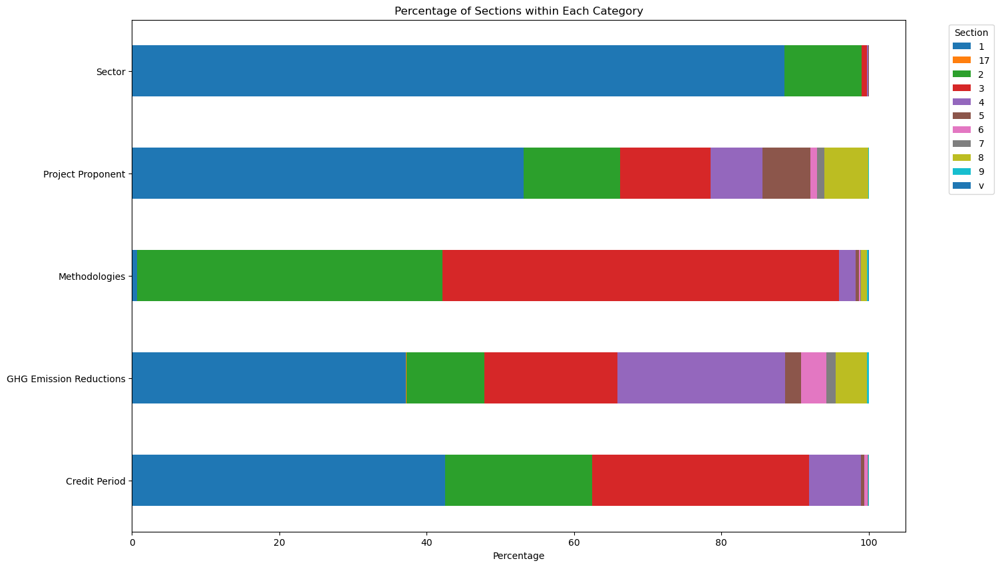

In [66]:
agg_data = stacked_df.groupby(['Section', 'section'])['id'].nunique().unstack(fill_value=0)
percentage_data = agg_data.div(agg_data.sum(axis=1), axis=0) * 100

ax = percentage_data.plot(kind='barh', stacked=True, figsize=(15, 10))

plt.xlabel('Percentage')
plt.ylabel('')
plt.title('Percentage of Sections within Each Category')
plt.legend(title='Section', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.show()

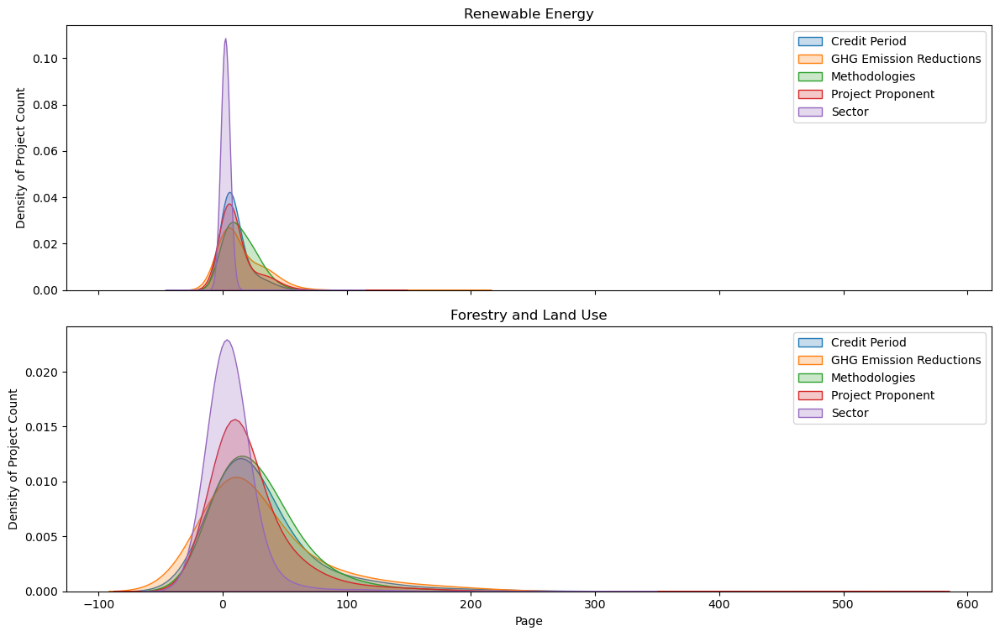

In [67]:
project_sectors = ['Renewable Energy', 'Forestry and Land Use']

fig, axes = plt.subplots(nrows=len(project_sectors), ncols=1, figsize=(12, 4 * len(project_sectors)), sharex=True)

for idx, sector in enumerate(project_sectors):
    sector_df = stacked_df[stacked_df['Project Sector'] == sector]

    distinct_counts = sector_df.groupby(['Section', 'page'])['id'].nunique().reset_index(name='distinct_id_count')

    sections = distinct_counts['Section'].unique()

    for section in sections:
        section_df = distinct_counts[distinct_counts['Section'] == section]
        sns.kdeplot(data=section_df, x='page', weights='distinct_id_count', label=section, fill=True, ax=axes[idx])
    
    axes[idx].set_title(sector)
    axes[idx].set_ylabel('Density of Project Count')
    axes[idx].legend()

plt.xlabel('Page')
plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

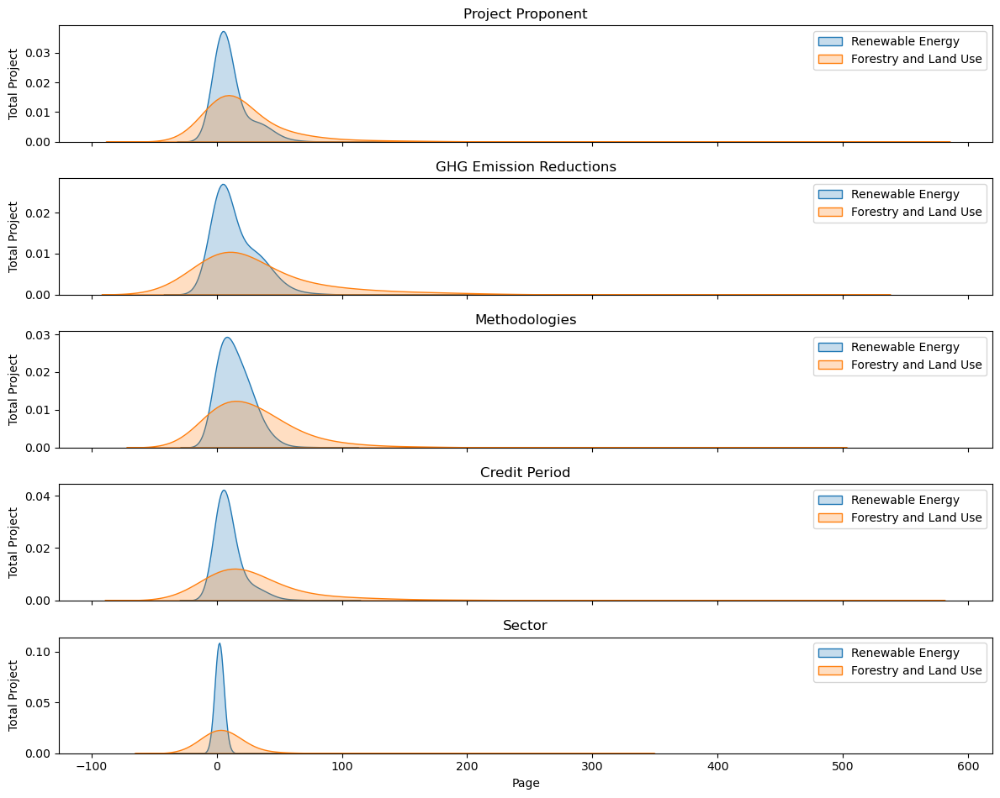

In [68]:
project_sectors = ['Renewable Energy', 'Forestry and Land Use']

sections = stacked_df['Section'].unique()

fig, axes = plt.subplots(nrows=len(sections), ncols=1, figsize=(12, 2 * len(sections)), sharex=True)

for idx, section in enumerate(sections):
    section_df = stacked_df[stacked_df['Section'] == section]

    for sector in project_sectors:
        sector_df = section_df[section_df['Project Sector'] == sector]
        distinct_counts = sector_df.groupby(['page'])['id'].nunique().reset_index(name='distinct_id_count')
        sns.kdeplot(data=distinct_counts, x='page', weights='distinct_id_count', label=sector, fill=True, ax=axes[idx])

    axes[idx].set_title(section)
    axes[idx].set_ylabel('Total Project')
    axes[idx].legend()

plt.xlabel('Page')
plt.tight_layout(rect=[0, 0, 1, 0.96])

plt.show()

In [69]:
country_counts = stacked_df.groupby('Project Country').agg(Total_Count=('id', 'count')).reset_index()
filtered_country = country_counts[country_counts['Total_Count'] > 20]

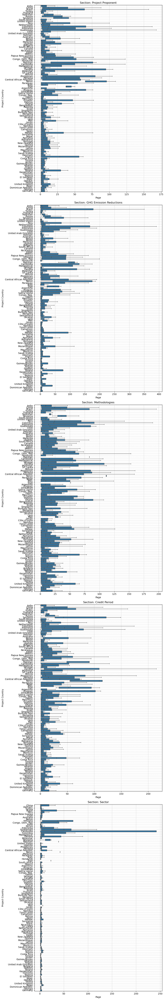

In [70]:
filtered_project = stacked_df[stacked_df['Project Country'].isin(filtered_country['Project Country'].to_list())]
sections = filtered_project['Section'].unique()
n_sections = len(sections)

figsize = (10, 12 * n_sections)
fig, axes = plt.subplots(nrows=n_sections, ncols=1, figsize=figsize)

if n_sections == 1:
    axes = [axes]

for ax, section in zip(axes, sections):
    section_data = filtered_project[filtered_project['Section'] == section]
    sns.boxplot(data=section_data, x='page', y='Project Country', orient='h', showfliers=False, ax=ax)
    ax.set_title(f'Section: {section}')
    ax.set_xlabel('Page')
    ax.set_ylabel('Project Country')
    ax.grid(True, linestyle='--', alpha=0.7)
    
plt.tight_layout()
plt.show()

In [71]:
filtered_project = stacked_df[stacked_df['Project Country'].isin(filtered_country['Project Country'].to_list())]
filtered_project['page_percentage'] = filtered_project['page']/filtered_project['max_page']
sections = filtered_project['Section'].unique()
n_sections = len(sections)

figsize = (10, 12 * n_sections)
fig, axes = plt.subplots(nrows=n_sections, ncols=1, figsize=figsize)

if n_sections == 1:
    axes = [axes]

for ax, section in zip(axes, sections):
    section_data = filtered_project[filtered_project['Section'] == section]
    sns.boxplot(data=section_data, x='page_percentage', y='Project Country', orient='h', showfliers=False, ax=ax)
    ax.set_title(f'Section: {section}')
    ax.set_xlabel('Page')
    ax.set_ylabel('Project Country')
    ax.grid(True, linestyle='--', alpha=0.7)
    
plt.tight_layout()
plt.show()

KeyError: 'max_page'

### 4. how to deal with missing headings

- Leave the minority
- Find more matching
- Pass to RAG pipeline and extract section in page number?
- loop through each page, search for specific keyword, and get more possible section mapping

In [72]:
non_matched_ids = (
    set(toc[~toc['id'].isin(matched_proponent['id'])]['id'].unique()) |
    set(toc[~toc['id'].isin(matched_emission_reductions['id'])]['id'].unique()) |
    set(toc[~toc['id'].isin(matched_methodology['id'])]['id'].unique()) |
    set(toc[~toc['id'].isin(matched_project_desc['id'])]['id'].unique()) |
    set(toc[~toc['id'].isin(matched_credit_period['id'])]['id'].unique()) |
    set(toc[~toc['id'].isin(matched_sector['id'])]['id'].unique())
)
sorted_non_matched_ids = sorted(non_matched_ids)
len(sorted_non_matched_ids)

572

In [106]:
new_matching = pd.read_csv('C:/Users/KornkamolSampaongern/LLMInformationExtraction/data/intermediate/analysis/keywords_found_in_pages.csv')

In [108]:
new_matching = new_matching.merge(toc, on='id', how='left')

In [109]:
new_matching = new_matching[~new_matching['toc'].str.contains('MW', na=False)]

In [110]:
df = new_matching[['Category','toc']]

In [111]:
df

,Category,toc
0,Project Proponent,1.1 Project title
2,Project Proponent,1.2 Type/Category of the project
3,Project Proponent,1.3 Estimated amount of emission reductions ov...
4,Project Proponent,1.4 A brief description of the project:
5,Project Proponent,1.5 Project location including geographic and ...
...,...,...
2548443,Credit Period,5.3 Biodiversity Impact Monitoring
2548444,Credit Period,"5.3.1 Biodiversity Monitoring Plan (B4.1, B4.2..."
2548445,Credit Period,5.3.2 Biodiversity Monitoring Plan Disseminati...
2548446,Credit Period,5.4 Optional Criterion: Exceptional Biodiversi...


In [143]:
import nltk
from nltk.corpus import stopwords

# Download the stopwords list if you haven't already
nltk.download('stopwords')

# Get the list of English stop words
stop_words = set(stopwords.words('english'))

# Filter the DataFrame to exclude rows where 'heading_name' is a stopword
filtered_df = new_matching[~new_matching['heading_name'].str.lower().isin(stop_words)]

filtered_df = filtered_df[['heading_name', '']]

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\KornkamolSampaongern\AppData\Roaming\nltk_dat
[nltk_data]     a...
[nltk_data]   Package stopwords is already up-to-date!


,Category,Page Number,id,toc,page,filename,next_section_page,section_number,section,Registry,Project Sector,Project Country,Project Methodologies,Project Region,Project Continent,heading_name
9,Project Proponent,7,321,"1.9 Project technologies, products, services a...",7,321_v-3-i-01-b-0075_-_6.2_mw_(vcs_pd)_bundled_...,11,1.9,1,Verra,Renewable Energy,India,AMS-I.D. Grid connected renewable electricity ...,APAC,Asia,Project
48,Project Proponent,15,321,1.15 Project participants / roles and responsi...,14,321_v-3-i-01-b-0075_-_6.2_mw_(vcs_pd)_bundled_...,15,1.15,1,Verra,Renewable Energy,India,AMS-I.D. Grid connected renewable electricity ...,APAC,Asia,Project
83,Project Proponent,17,321,1.17 List of commercially sensitive informatio...,17,321_v-3-i-01-b-0075_-_6.2_mw_(vcs_pd)_bundled_...,17,1.17,1,Verra,Renewable Energy,India,AMS-I.D. Grid connected renewable electricity ...,APAC,Asia,List
84,Project Proponent,17,321,2.1 Title and reference of the VCS methodology...,17,321_v-3-i-01-b-0075_-_6.2_mw_(vcs_pd)_bundled_...,17,2.1,2,Verra,Renewable Energy,India,AMS-I.D. Grid connected renewable electricity ...,APAC,Asia,Title
85,Project Proponent,17,321,2.2 Justification of the choice of the methodo...,17,321_v-3-i-01-b-0075_-_6.2_mw_(vcs_pd)_bundled_...,18,2.2,2,Verra,Renewable Energy,India,AMS-I.D. Grid connected renewable electricity ...,APAC,Asia,Justification
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2548010,Credit Period,12,4646,2.1.10 Sustainable Development,12,4646_tist_ke_pd-vcs-011h_app07_verif_01_monito...,16,2.1.10,2,Verra,Forestry and Land Use,Kenya,AR-ACM0003 Afforestation and reforestation of ...,EMEA,Africa,Sustainable
2548129,Credit Period,17,4646,2.2.1 Implementation Schedule (G1.9),16,4646_tist_ke_pd-vcs-011h_app07_verif_01_monito...,18,2.2.1,2,Verra,Forestry and Land Use,Kenya,AR-ACM0003 Afforestation and reforestation of ...,EMEA,Africa,Implementation
2548287,Credit Period,46,4646,3.1.3 Monitoring Plan,44,4646_tist_ke_pd-vcs-011h_app07_verif_01_monito...,47,3.1.3,3,Verra,Forestry and Land Use,Kenya,AR-ACM0003 Afforestation and reforestation of ...,EMEA,Africa,Monitoring
2548407,Credit Period,49,4646,3.2.1 Baseline Emissions,47,4646_tist_ke_pd-vcs-011h_app07_verif_01_monito...,49,3.2.1,3,Verra,Forestry and Land Use,Kenya,AR-ACM0003 Afforestation and reforestation of ...,EMEA,Africa,Baseline


In [78]:
# new_matching.to_csv('missing_keywords_matching.csv')

In [147]:
grouped_counts = new_matching.groupby(['id', 'toc','Category']).size().reset_index(name='count')
grouped_counts

,id,toc,Category,count
0,1,7.25 MW wind energy project of Aruppukottai Sr...,Credit Period,7
1,1,7.25 MW wind energy project of Aruppukottai Sr...,GHG Emission Reductions,17
2,1,7.25 MW wind energy project of Aruppukottai Sr...,Methodology,14
3,1,7.25 MW wind energy project of Aruppukottai Sr...,Project Description,20
4,1,7.25 MW wind energy project of Aruppukottai Sr...,Project Proponent,12
...,...,...,...,...
158102,4646,5.4.1 Trigger Species Population Trends (GL3.3),Credit Period,4
158103,4646,5.4.1 Trigger Species Population Trends (GL3.3),GHG Emission Reductions,33
158104,4646,5.4.1 Trigger Species Population Trends (GL3.3),Methodology,9
158105,4646,5.4.1 Trigger Species Population Trends (GL3.3),Project Description,51


In [80]:
new_matching[new_matching['toc'].str.contains('SSummary DDescriptionn of the Prooject')]['id'].unique()

array([1495], dtype=int64)

In [81]:
new_matching[new_matching['toc'].str.contains('SSummary DDescriptionn of the Prooject')]['id'].unique()

array([1495], dtype=int64)

In [82]:
new_matching['toc'].str.split(' ')


KeyboardInterrupt



In [ ]:
new_matching['heading_name'] = new_matching['heading_name'].str.lower()
df = new_matching[['Category', 'heading_name']].drop_duplicates()
df['Category'].value_counts()

In [ ]:
merged_df = pd.merge(grouped_counts, new_matching, on=['id', 'toc','Category'])
result_df = merged_df.sort_values(by='count', ascending=False).drop_duplicates(subset=['id', 'toc','Category'])
result_df[result_df['Category']=='Project Proponent']

In [148]:
new_matching = new_matching[(new_matching['Page Number'] >= new_matching['page']) & (new_matching['Page Number'] <= new_matching['next_section_page'])]

In [135]:
df

In [84]:
new_matching[new_matching['Category']=='Project Proponent'][['toc', 'section','id']].drop_duplicates()

,toc,section,id
8,1.8 A description of how the project will achi...,1,321
9,"1.9 Project technologies, products, services a...",1,321
48,1.15 Project participants / roles and responsi...,1,321
49,1.16 Any information relevant for the eligibil...,1,321
83,1.17 List of commercially sensitive informatio...,1,321
...,...,...,...
30597147,3.1.1 Data and Parameters Available at Validation,3,4646
30597291,4.4.5 Governance and Implementation Structures...,4,4646
30597292,4.4.6 Smallholders/Community Members Capacity ...,4,4646
30597293,5.1 Net Positive Biodiversity Impacts,5,4646


In [59]:
!pip install wordcloud

In [155]:
import re

# Get the list of English stop words
stop_words = set(stopwords.words('english'))

def process_toc(text):
    # Remove everything before the first space
    text = text.split(' ', 1)[-1]
    
    # Remove anything within parentheses
    text = re.sub(r'\(.*?\)', '', text)
    
    # Remove stopwords
    words = [word for word in text.split() if word.lower() not in stop_words]
    
    # Join the words back into a string
    return ' '.join(words)

# Apply the process_toc function to the 'toc' column
df['toc'] = df['toc'].apply(process_toc)

# Display the processed DataFrame
print(df['toc'].head())

8     description project achieve GHG emission reduc...
9     Project technologies, products, services expec...
48    Project participants / roles responsibilities,...
49    information relevant eligibility project quant...
82    information relevant eligibility project quant...
Name: toc, dtype: object


C:\Users\KornkamolSampaongern\AppData\Local\Temp\ipykernel_9708\2220782574.py:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['toc'] = df['toc'].apply(process_toc)


In [157]:
df = df.drop_duplicates(subset=['toc','Category'])

In [167]:
df.to_csv('test.csv', index=False)

In [166]:
def contains_digit(string):
    return any(char in '0123456789' for char in string)

# Apply the function to filter out rows that contain digits in the 'toc' column
df_cleaned = df[~df['toc'].apply(contains_digit)]

In [158]:
df1 = df

In [2]:
df = pd.read_csv('C:/Users/KornkamolSampaongern/LLMInformationExtraction/data/intermediate/analysis/headings.csv')

In [6]:
df['section_clean'] = df['section'].str.split(' ', n=1).str[1]

In [9]:
df['group'] = 1  # Start the counter at 1

for i in range(1, len(df)):
    if df.loc[i, 'start_page'] < df.loc[i-1, 'start_page']:  # If the current value is less than the previous one
        df.loc[i:, 'group'] += 1  # Increase the group number from that point onward

In [10]:
df

,section,start_page,end_page,section_clean,group
0,1.1 Summary Description of the Project,2,2,Summary Description of the Project,1
1,1.2 Sectoral Scope and Project Type,2,2,Sectoral Scope and Project Type,1
2,1.3 Project Proponent,2,2,Project Proponent,1
3,1.4 Other Entities Involved in the Project,2,3,Other Entities Involved in the Project,1
4,1.5 Project Start Date,3,3,Project Start Date,1
...,...,...,...,...,...
126296,F.1. Documentation on the analysis of the envi...,26,27,Documentation on the analysis of the environme...,2614
126297,F.2. If environmental impacts are considered s...,27,27,If environmental impacts are considered signif...,2614
126298,G.1. Brief description how comments by local s...,27,27,Brief description how comments by local stakeh...,2614
126299,G.2. Summary of the comments received:,27,28,Summary of the comments received:,2614


In [17]:
df[df['section_clean'].str.lower().str.contains('proponent')]['group'].nunique()

2229

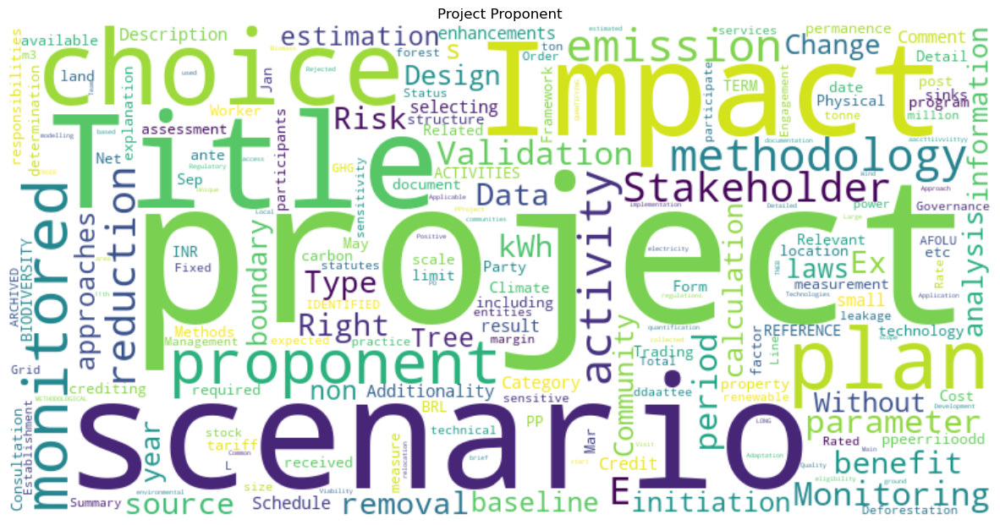

In [160]:
from wordcloud import WordCloud

text = ' '.join(df[df['Category']=='Project Proponent']['toc'].dropna().astype(str))

# Split the text into individual words, convert to a set to remove duplicates, then join back into a string
unique_text = ' '.join(set(text.split()))
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(unique_text)

# Plot the word cloud
plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Project Proponent')
plt.axis('off')
plt.show()

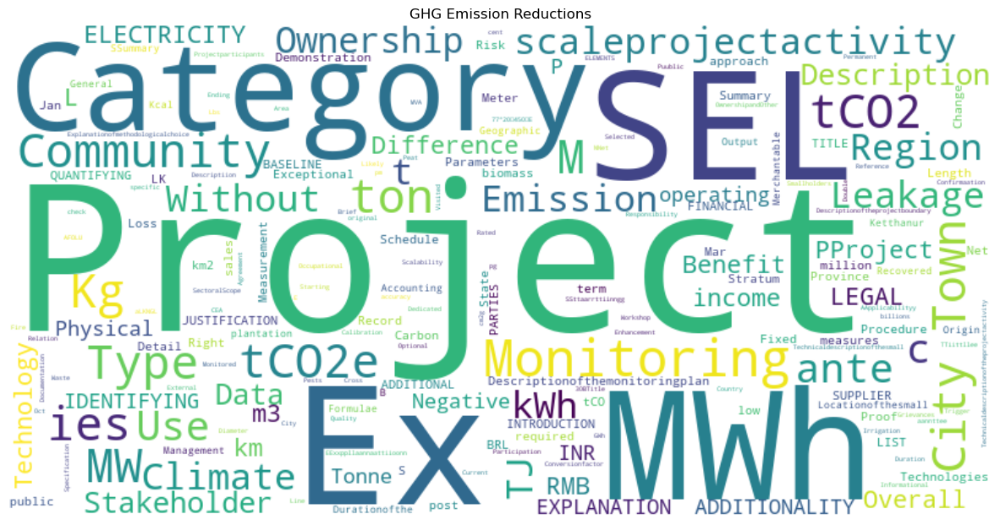

In [89]:
df = new_matching[new_matching['Category']=='GHG Emission Reductions']['heading_name']
text = ' '.join(df)

unique_text = ' '.join(set(text.split()))
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(unique_text)

plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('GHG Emission Reductions')
plt.axis('off')
plt.show()

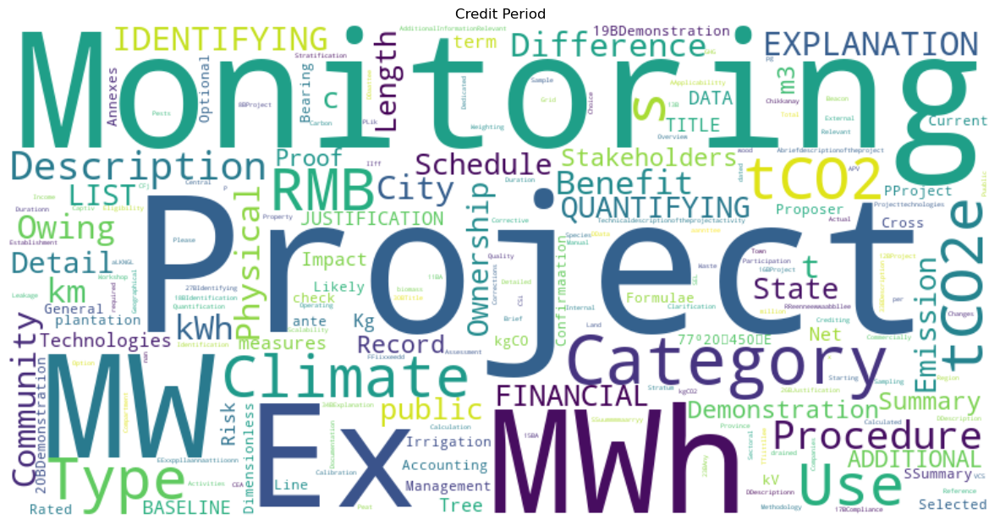

In [90]:
df = new_matching[new_matching['Category']=='Credit Period']['heading_name'].astype('str')
text = ' '.join(df)

unique_text = ' '.join(set(text.split()))
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(unique_text)

plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Credit Period')
plt.axis('off')
plt.show()

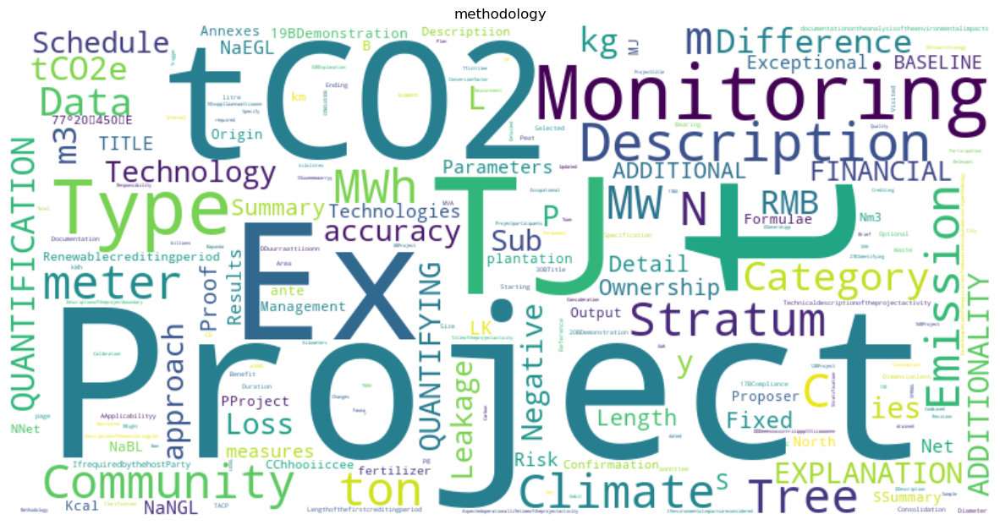

In [91]:
df = new_matching[new_matching['Category']=='Methodology']['heading_name'].astype('str')
text = ' '.join(df)

unique_text = ' '.join(set(text.split()))
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(unique_text)

plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('methodology')
plt.axis('off')
plt.show()

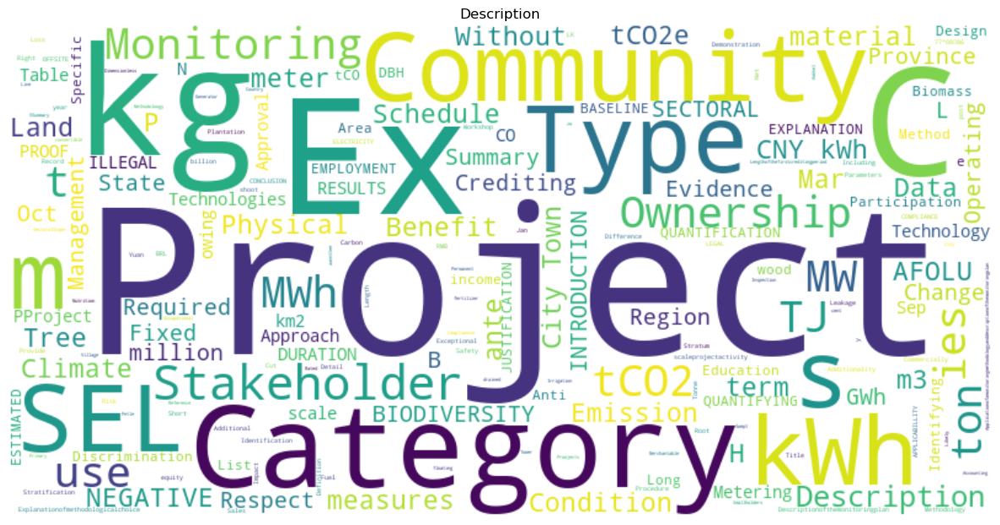

In [92]:
df = new_matching[new_matching['Category']=='Project Description']['heading_name'].astype('str')
text = ' '.join(df)

unique_text = ' '.join(set(text.split()))
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(unique_text)

plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Description')
plt.axis('off')
plt.show()

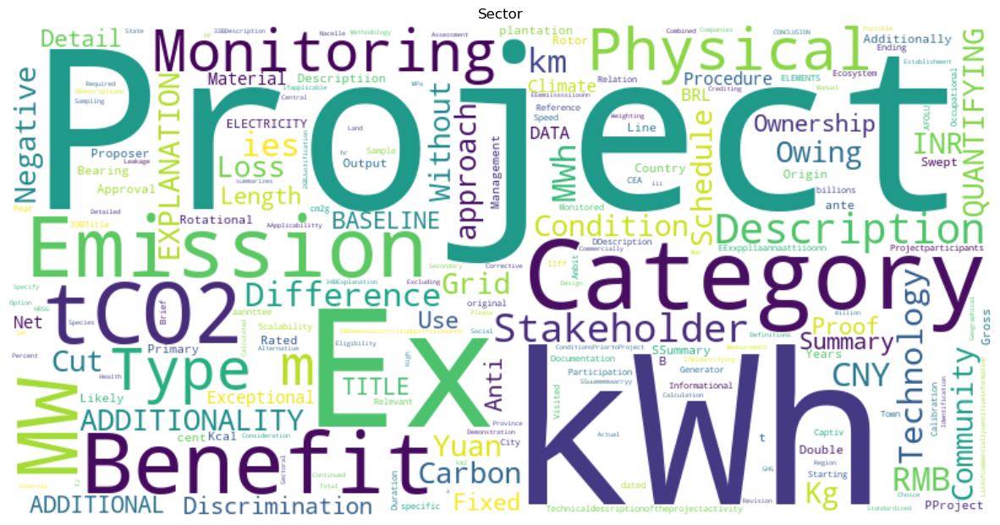

In [93]:
df = new_matching[new_matching['Category']=='Sector']['heading_name'].astype('str')
text = ' '.join(df)

unique_text = ' '.join(set(text.split()))
wordcloud = WordCloud(width=800, height=400, background_color='white').generate(unique_text)

plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Sector')
plt.axis('off')
plt.show()

In [3]:
result_before = pd.read_csv('evaluation-before.csv')
result_after = pd.read_csv('evaluation-after.csv')

In [5]:
result_before.columns

Index(['inputs.question', 'inputs.answer', 'inputs.context',
       'inputs.ground_truth', 'gpt_coherence', 'gpt_fluency', 'gpt_similarity',
       'f1_score', 'index', 'status'],
      dtype='object')

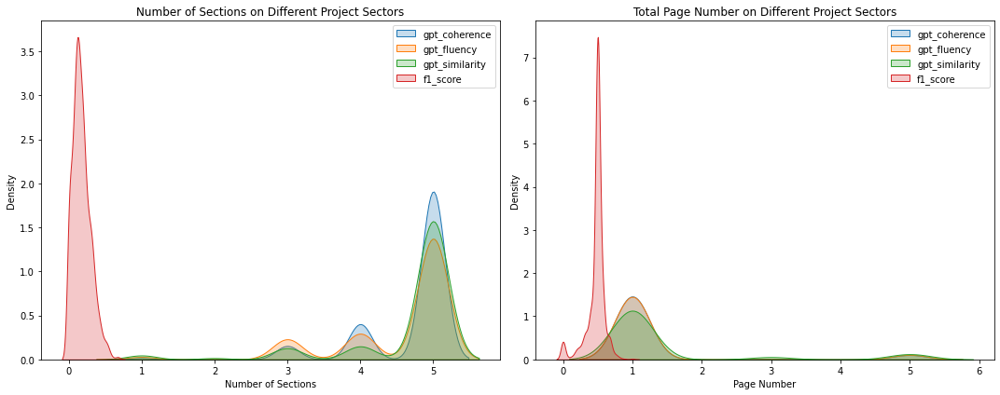

In [6]:
fig, axes = plt.subplots(1, 2, figsize=(15, 6), sharey=False)

sns.kdeplot(result_before['gpt_coherence'], label='gpt_coherence', shade=True, ax=axes[0])
sns.kdeplot(result_before['gpt_fluency'], label='gpt_fluency', shade=True, ax=axes[0])
sns.kdeplot(result_before['gpt_similarity'], label='gpt_similarity', shade=True, ax=axes[0])
sns.kdeplot(result_before['f1_score'], label='f1_score', shade=True, ax=axes[0])

axes[0].set_xlabel('Number of Sections')
axes[0].set_ylabel('Density')
axes[0].set_title('Number of Sections on Different Project Sectors')
axes[0].legend()

sns.kdeplot(result_after['gpt_coherence'], label='gpt_coherence', shade=True, ax=axes[1])
sns.kdeplot(result_after['gpt_fluency'], label='gpt_fluency', shade=True, ax=axes[1])
sns.kdeplot(result_after['gpt_similarity'], label='gpt_similarity', shade=True, ax=axes[1])
sns.kdeplot(result_after['f1_score'], label='f1_score', shade=True, ax=axes[1])

axes[1].set_xlabel('Page Number')
axes[1].set_ylabel('Density')
axes[1].set_title('Total Page Number on Different Project Sectors')
axes[1].legend()

# Adjust layout
plt.tight_layout()
plt.show()

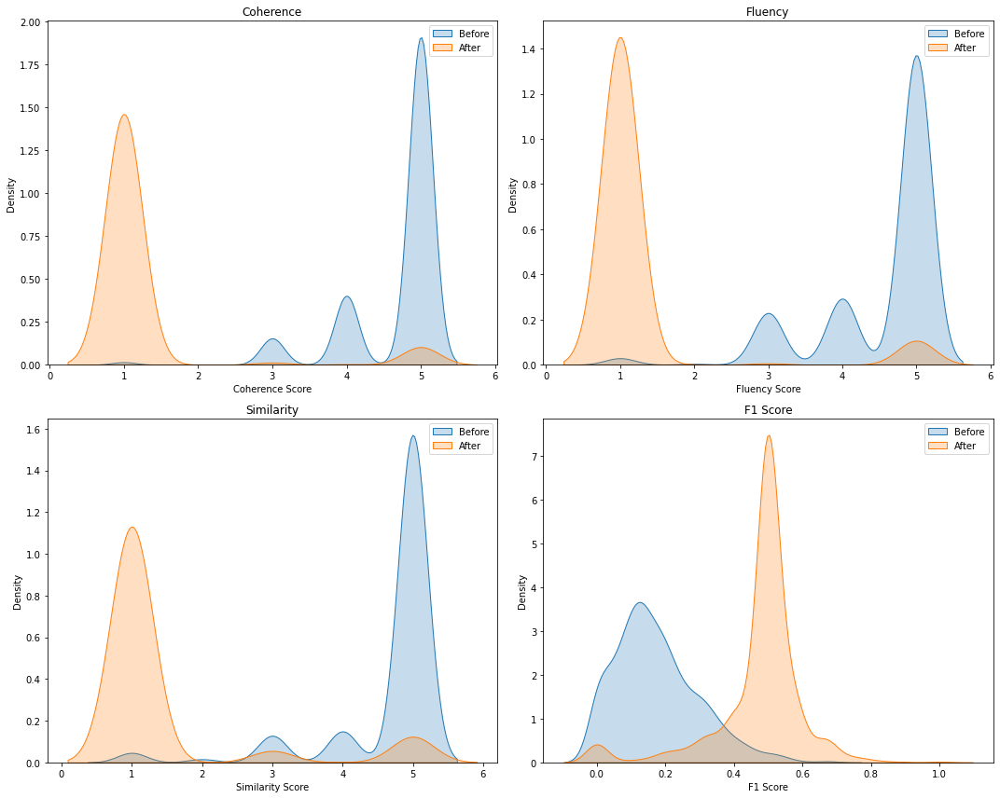

In [9]:
fig, axes = plt.subplots(2, 2, figsize=(15, 12), sharey=False)

# KDE plot for 'gpt_coherence'
sns.kdeplot(result_before['gpt_coherence'], label='Before', shade=True, ax=axes[0, 0])
sns.kdeplot(result_after['gpt_coherence'], label='After', shade=True, ax=axes[0, 0])
axes[0, 0].set_xlabel('Coherence Score')
axes[0, 0].set_ylabel('Density')
axes[0, 0].set_title('Coherence')
axes[0, 0].legend()

# KDE plot for 'gpt_fluency'
sns.kdeplot(result_before['gpt_fluency'], label='Before', shade=True, ax=axes[0, 1])
sns.kdeplot(result_after['gpt_fluency'], label='After', shade=True, ax=axes[0, 1])
axes[0, 1].set_xlabel('Fluency Score')
axes[0, 1].set_ylabel('Density')
axes[0, 1].set_title('Fluency')
axes[0, 1].legend()

# KDE plot for 'gpt_similarity'
sns.kdeplot(result_before['gpt_similarity'], label='Before', shade=True, ax=axes[1, 0])
sns.kdeplot(result_after['gpt_similarity'], label='After', shade=True, ax=axes[1, 0])
axes[1, 0].set_xlabel('Similarity Score')
axes[1, 0].set_ylabel('Density')
axes[1, 0].set_title('Similarity')
axes[1, 0].legend()

# KDE plot for 'f1_score'
sns.kdeplot(result_before['f1_score'], label='Before', shade=True, ax=axes[1, 1])
sns.kdeplot(result_after['f1_score'], label='After', shade=True, ax=axes[1, 1])
axes[1, 1].set_xlabel('F1 Score')
axes[1, 1].set_ylabel('Density')
axes[1, 1].set_title('F1 Score')
axes[1, 1].legend()

# Adjust layout
plt.tight_layout()
plt.show()

In [13]:
df = pd.read_parquet('../context_retrieval.parquet',engine='fastparquet')

ImportError: Missing optional dependency 'fastparquet'. fastparquet is required for parquet support. Use pip or conda to install fastparquet.

In [26]:
df

,section,start_page,end_page,section_clean,group
0,1.1 Summary Description of the Project,2,2,Summary Description of the Project,1
1,1.2 Sectoral Scope and Project Type,2,2,Sectoral Scope and Project Type,1
2,1.3 Project Proponent,2,2,Project Proponent,1
3,1.4 Other Entities Involved in the Project,2,3,Other Entities Involved in the Project,1
4,1.5 Project Start Date,3,3,Project Start Date,1
...,...,...,...,...,...
126296,F.1. Documentation on the analysis of the envi...,26,27,Documentation on the analysis of the environme...,2614
126297,F.2. If environmental impacts are considered s...,27,27,If environmental impacts are considered signif...,2614
126298,G.1. Brief description how comments by local s...,27,27,Brief description how comments by local stakeh...,2614
126299,G.2. Summary of the comments received:,27,28,Summary of the comments received:,2614


In [45]:
import matplotlib.pyplot as plt
import re
import nltk
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud

nltk.download('stopwords')
stop_words = set(stopwords.words('english'))

In [62]:
sns.set_style('whitegrid')

In [32]:
project_proponents = [
    "project proponent",
    "name of person",
    "participants",
    "proof of title",
    "supplier data",
    "carbon offset developer",
    "objective",
    "ownership",
    "property"
]

pattern = '|'.join(project_proponents)

matched_proponent = df[df['section_clean'].str.lower().str.contains(pattern)]

In [41]:
methodology = ['methodology', 'methodologies','method']

pattern = '|'.join(methodology)

matched_methodology = df[df['section_clean'].str.lower().str.contains(pattern)]

In [42]:
project_desc = [
        "summary",
        "description",
        "additional information",
        "location",
    ]

pattern = '|'.join(project_desc)

matched_project_desc = df[df['section_clean'].str.lower().str.contains(pattern)]

In [43]:
credit_period = [
        "crediting period",
        "credit period",
        "crediting",
        "category",
        "boundary",
        "net impact"
    ]

pattern = '|'.join(credit_period)

matched_credit_period = df[df['section_clean'].str.lower().str.contains(pattern)]

In [44]:
sector = [
        "scope",
        "project type",
        "sectoralscopeandtypeofproject",
        "sector",
        "category",
        "categories",
    ]

pattern = '|'.join(sector)

matched_sector = df[df['section_clean'].str.lower().str.contains(pattern)]

In [40]:
ghg_emission_reductions = [
        "reduction",
        "greenhouse",
        "emissions",
        "ghg",
        "greenhousegas",
        "project activity"
    ]

pattern = '|'.join(ghg_emission_reductions)

matched_emission_reductions = df[df['section_clean'].str.lower().str.contains(pattern)]

In [ ]:
def generate_ngrams(corpus, n=2):
    vectorizer = CountVectorizer(ngram_range=(n, n))
    X = vectorizer.fit_transform(corpus)
    ngram_freq = X.toarray().sum(axis=0)
    ngram_names = vectorizer.get_feature_names_out()
    
    ngram_list = sorted(zip(ngram_names, ngram_freq), key=lambda x: x[1], reverse=True)
    return ngram_list

In [64]:
def plot_ngram_frequencies(ngram_list, title="N-gram Frequencies"):
    ngrams, frequencies = zip(*ngram_list[:10])
    plt.figure(figsize=(10,6))
    plt.barh(ngrams, frequencies, color='lightsteelblue')
    plt.xlabel("Frequency")
    plt.title(title)
    plt.gca().invert_yaxis()
    plt.show()

In [81]:
def create_wordcloud(ngram_list):
    word_freq_dict = dict(ngram_list)
    wordcloud = WordCloud(width=800, height=400, background_color='black',colormap='ocean',max_words=50).generate_from_frequencies(word_freq_dict)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

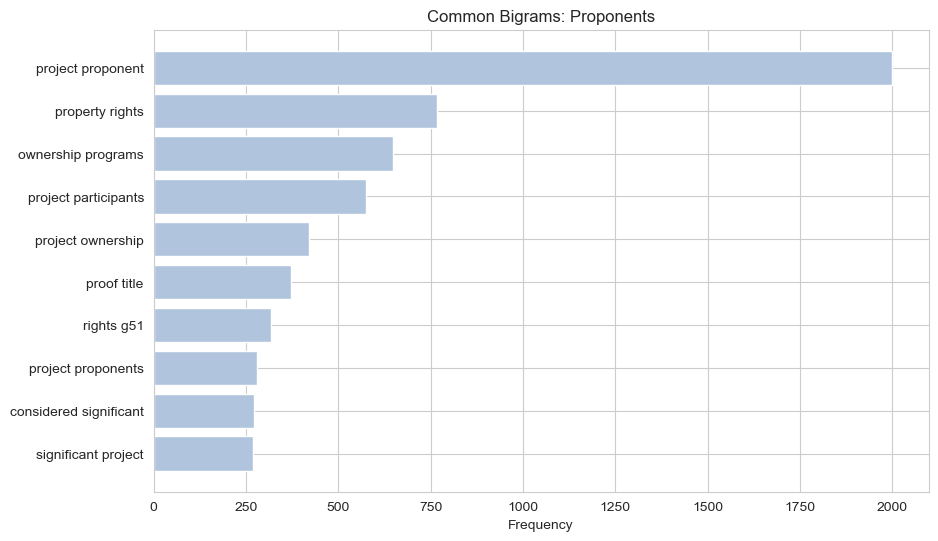

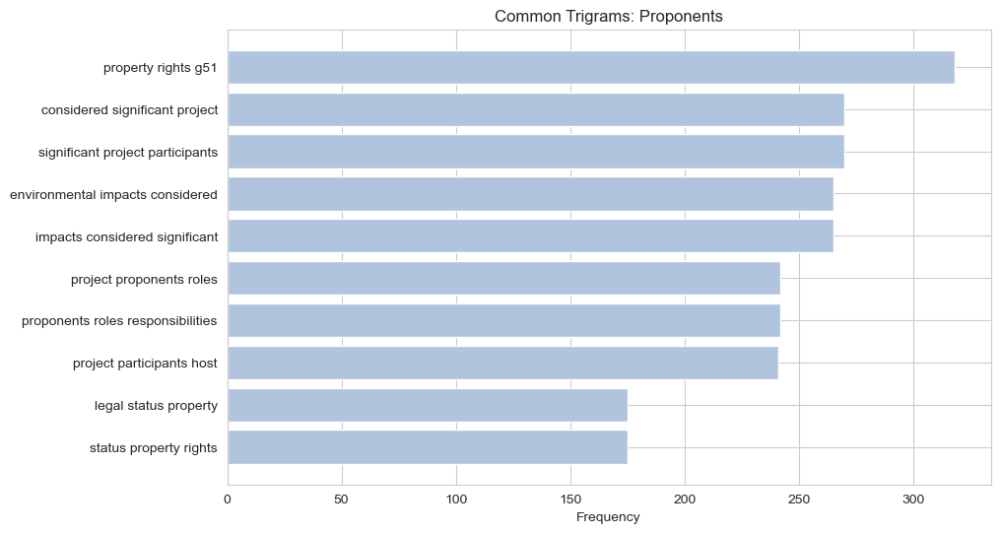

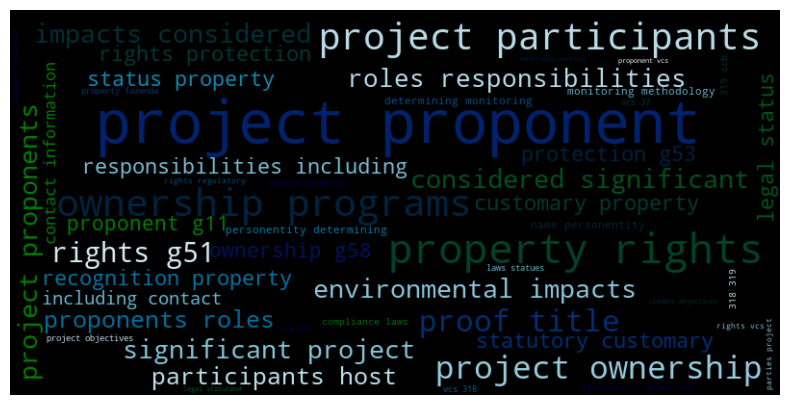

In [82]:
headings = matched_proponent['section_clean'].to_list()
cleaned_headings = [re.sub(r'[^\w\s]', '', heading.lower()) for heading in headings]
processed_headings = [' '.join([word for word in heading.split() if word not in stop_words]) for heading in cleaned_headings]

bigrams = generate_ngrams(processed_headings, n=2)
trigrams = generate_ngrams(processed_headings, n=3)

plot_ngram_frequencies(bigrams, title="Common Bigrams: Proponents")
plot_ngram_frequencies(trigrams, title="Common Trigrams: Proponents")

create_wordcloud(bigrams)

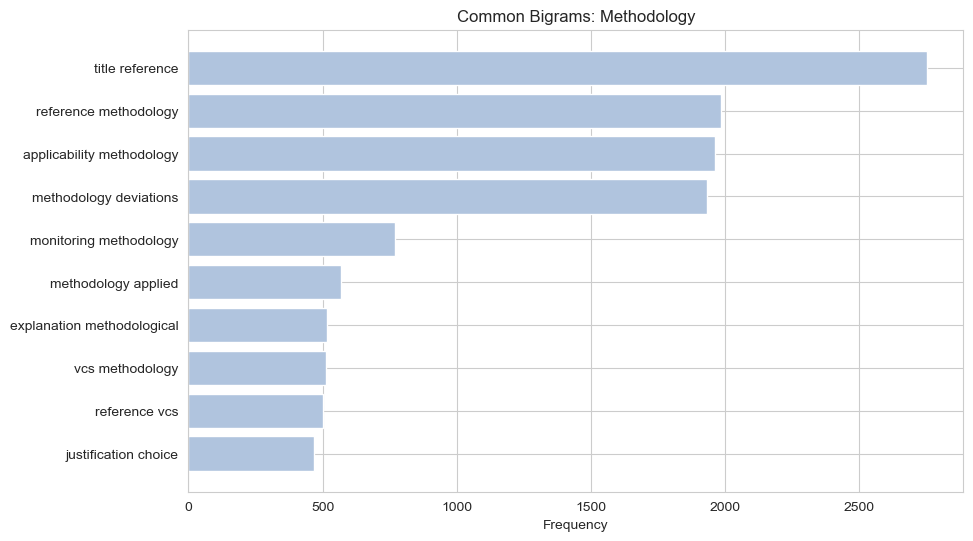

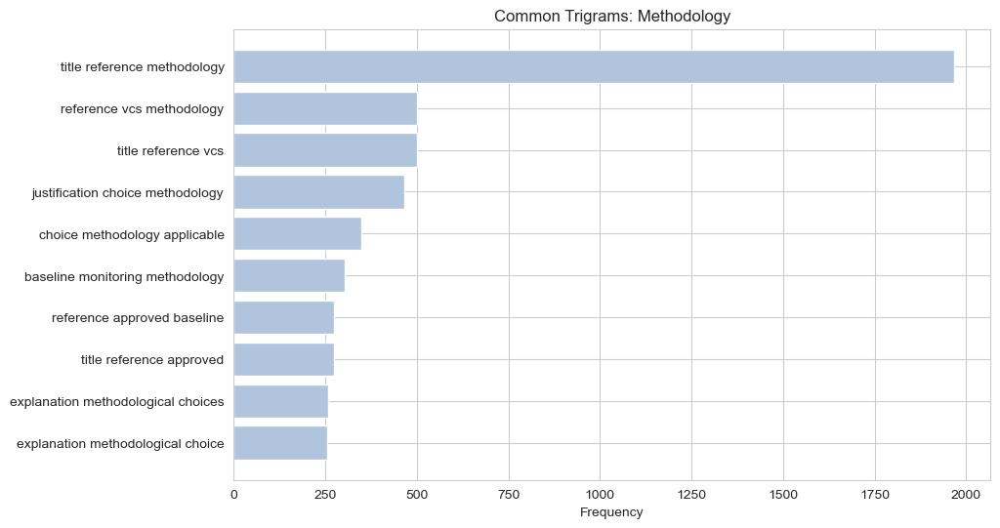

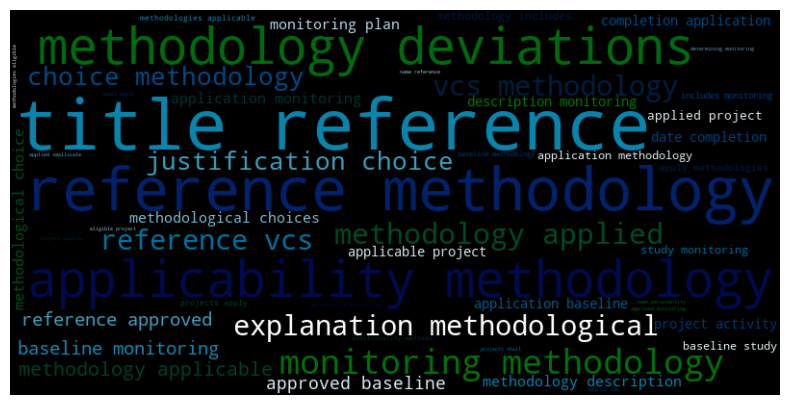

In [83]:
headings = matched_methodology['section_clean'].to_list()
cleaned_headings = [re.sub(r'[^\w\s]', '', heading.lower()) for heading in headings]
processed_headings = [' '.join([word for word in heading.split() if word not in stop_words]) for heading in cleaned_headings]

bigrams = generate_ngrams(processed_headings, n=2)
trigrams = generate_ngrams(processed_headings, n=3)

plot_ngram_frequencies(bigrams, title="Common Bigrams: Methodology")
plot_ngram_frequencies(trigrams, title="Common Trigrams: Methodology")

create_wordcloud(bigrams)

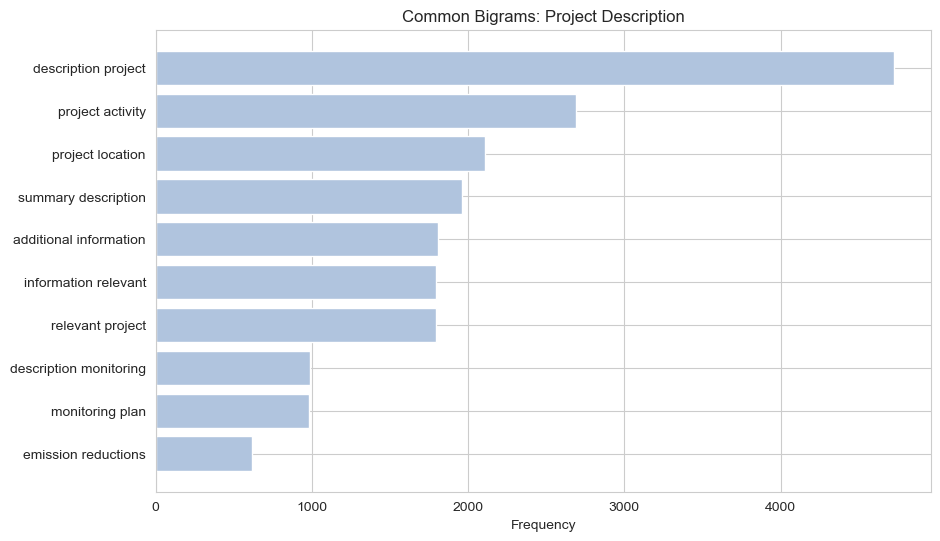

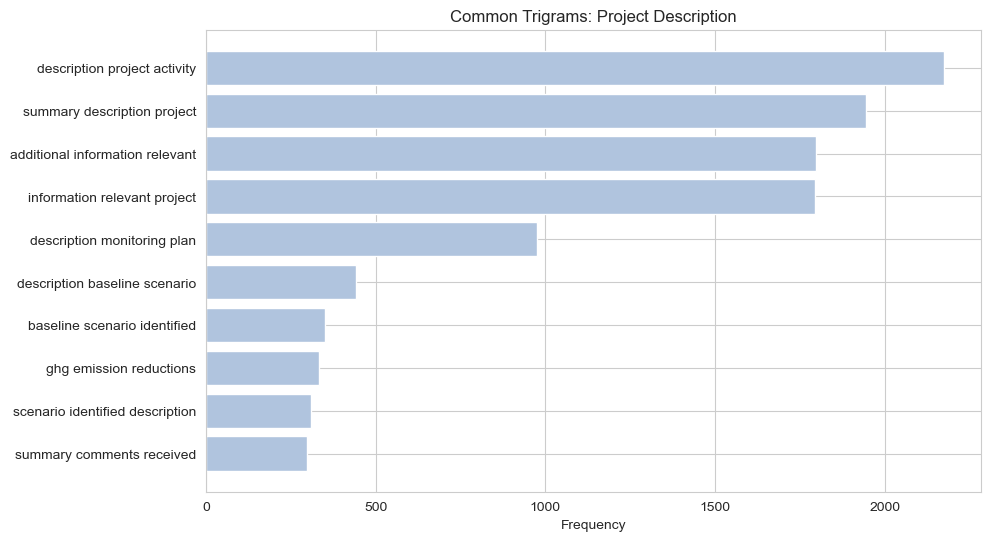

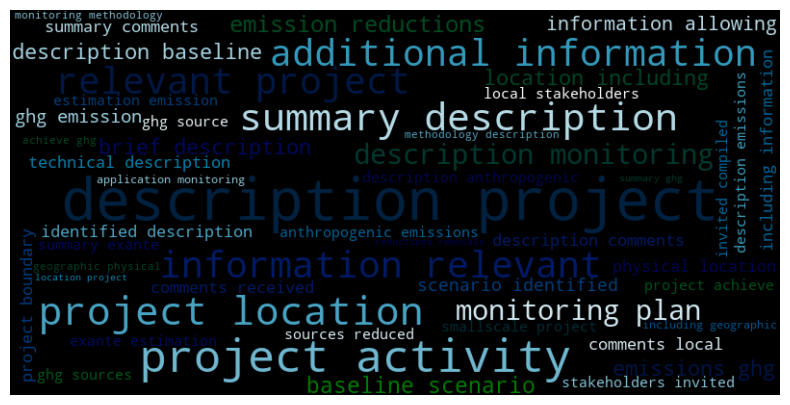

In [84]:
headings = matched_project_desc['section_clean'].to_list()
cleaned_headings = [re.sub(r'[^\w\s]', '', heading.lower()) for heading in headings]
processed_headings = [' '.join([word for word in heading.split() if word not in stop_words]) for heading in cleaned_headings]

bigrams = generate_ngrams(processed_headings, n=2)
trigrams = generate_ngrams(processed_headings, n=3)

plot_ngram_frequencies(bigrams, title="Common Bigrams: Project Description")
plot_ngram_frequencies(trigrams, title="Common Trigrams: Project Description")

create_wordcloud(bigrams)

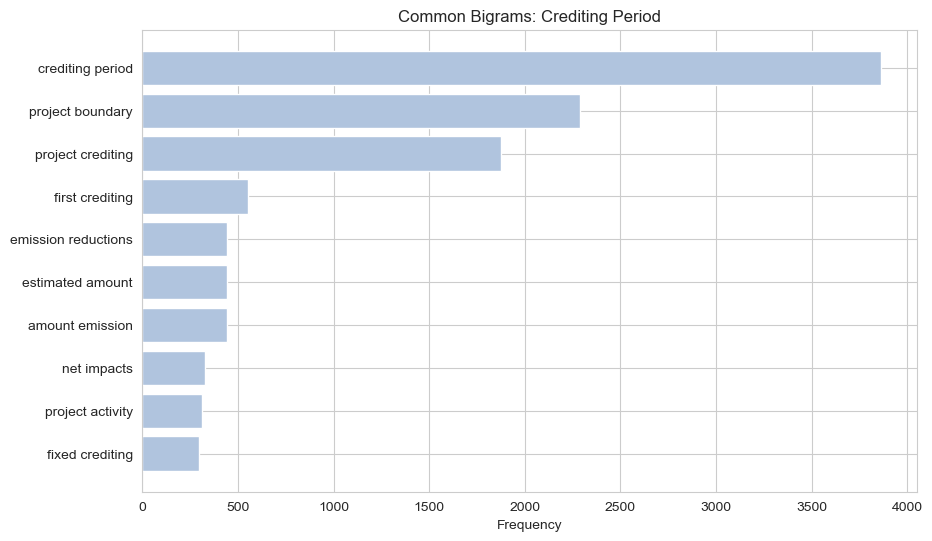

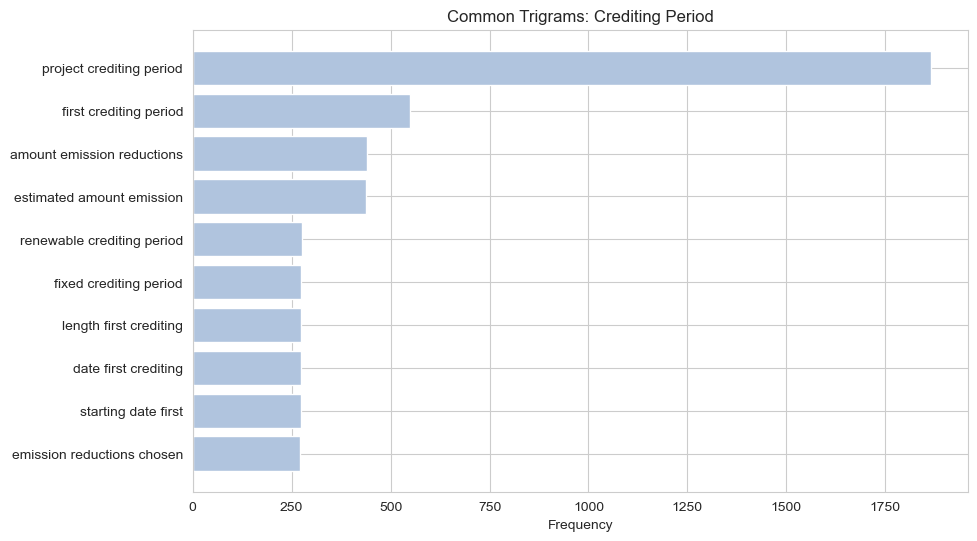

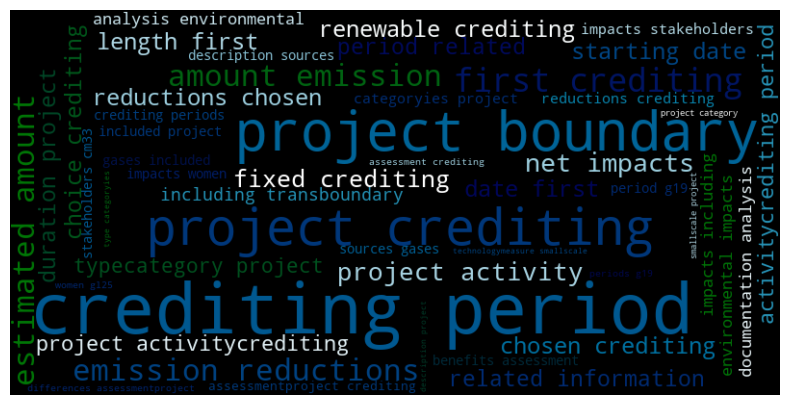

In [85]:
headings = matched_credit_period['section_clean'].to_list()
cleaned_headings = [re.sub(r'[^\w\s]', '', heading.lower()) for heading in headings]
processed_headings = [' '.join([word for word in heading.split() if word not in stop_words]) for heading in cleaned_headings]

bigrams = generate_ngrams(processed_headings, n=2)
trigrams = generate_ngrams(processed_headings, n=3)

plot_ngram_frequencies(bigrams, title="Common Bigrams: Crediting Period")
plot_ngram_frequencies(trigrams, title="Common Trigrams: Crediting Period")

create_wordcloud(bigrams)

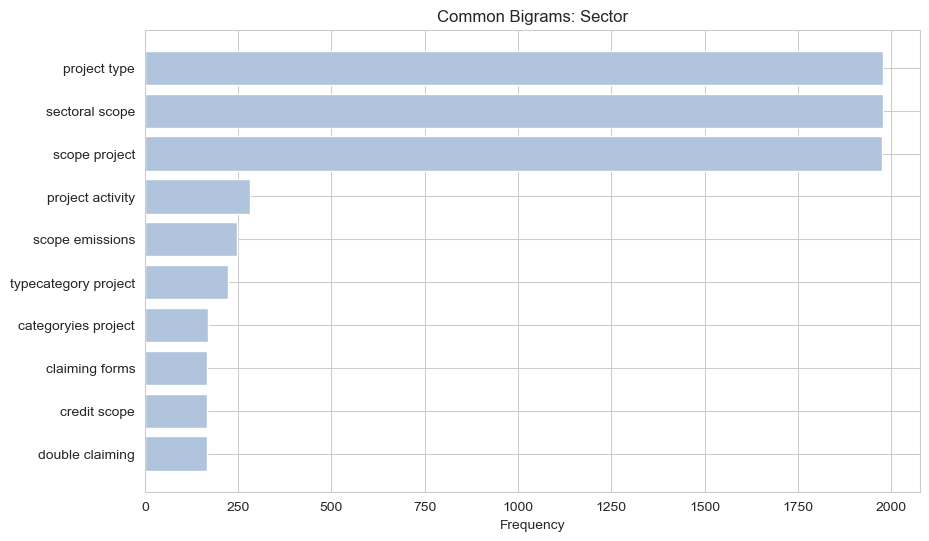

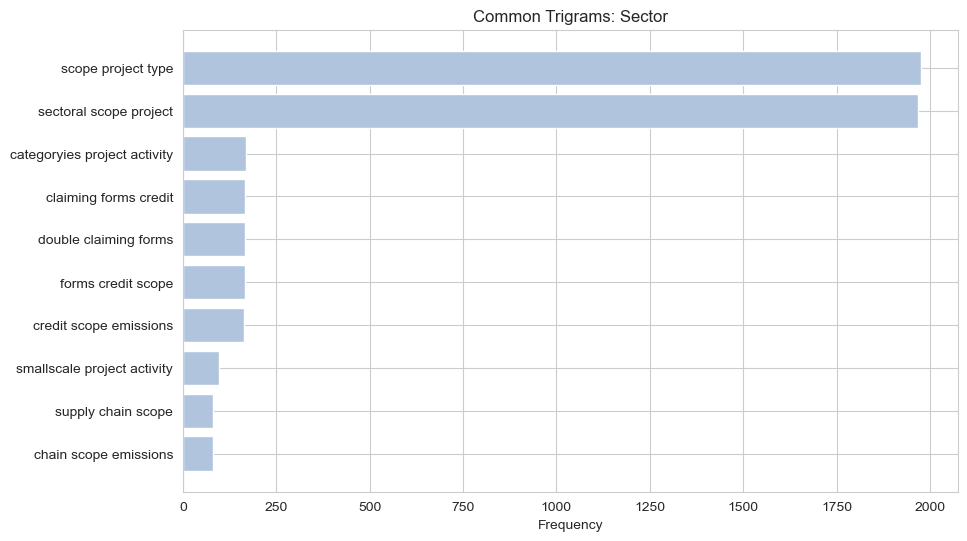

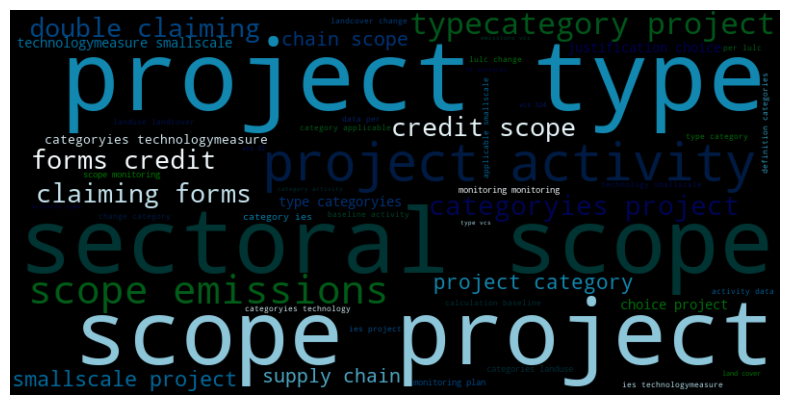

In [86]:
headings = matched_sector['section_clean'].to_list()
cleaned_headings = [re.sub(r'[^\w\s]', '', heading.lower()) for heading in headings]
processed_headings = [' '.join([word for word in heading.split() if word not in stop_words]) for heading in cleaned_headings]

bigrams = generate_ngrams(processed_headings, n=2)
trigrams = generate_ngrams(processed_headings, n=3)

plot_ngram_frequencies(bigrams, title="Common Bigrams: Sector")
plot_ngram_frequencies(trigrams, title="Common Trigrams: Sector")

create_wordcloud(bigrams)

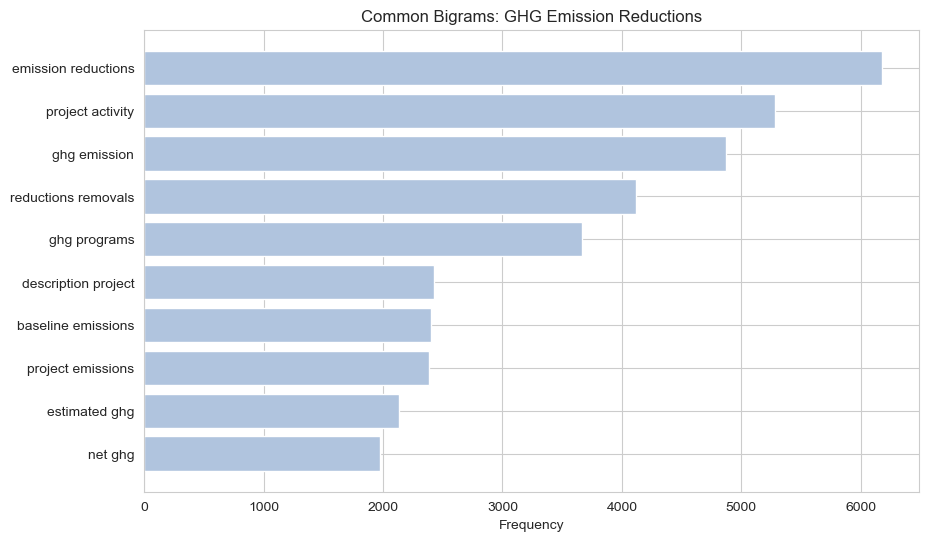

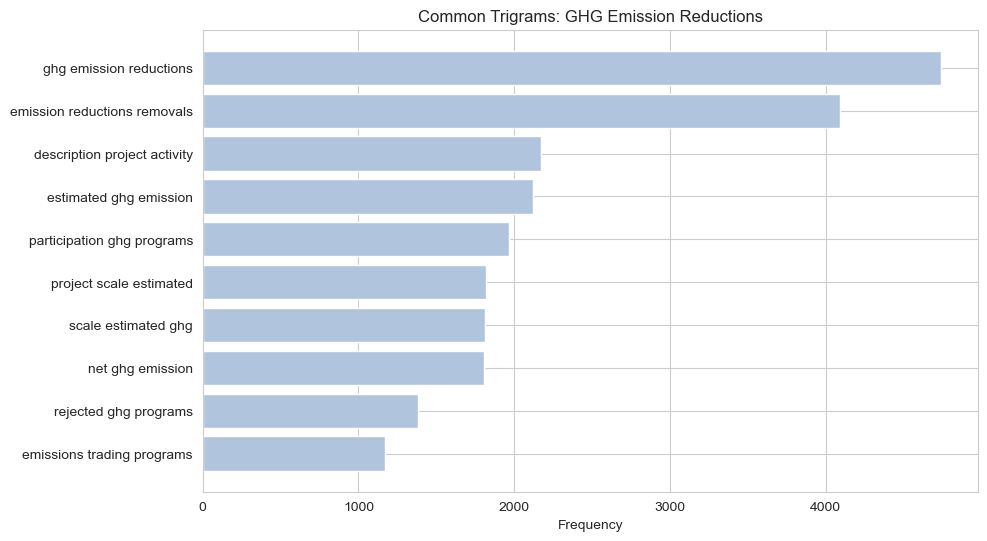

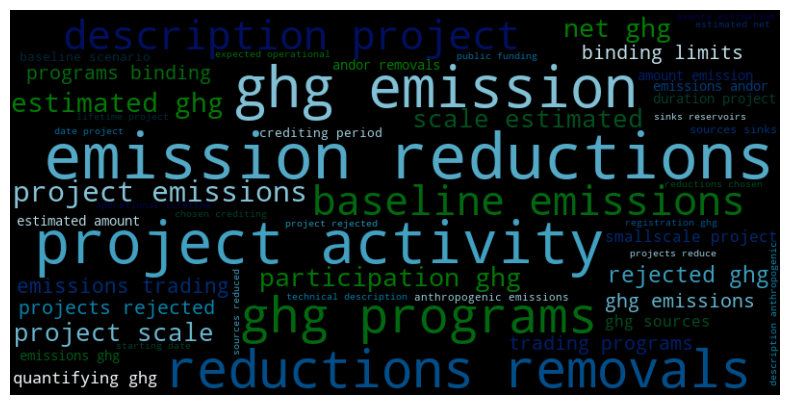

In [87]:
headings = matched_emission_reductions['section_clean'].to_list()
cleaned_headings = [re.sub(r'[^\w\s]', '', heading.lower()) for heading in headings]
processed_headings = [' '.join([word for word in heading.split() if word not in stop_words]) for heading in cleaned_headings]

bigrams = generate_ngrams(processed_headings, n=2)
trigrams = generate_ngrams(processed_headings, n=3)

plot_ngram_frequencies(bigrams, title="Common Bigrams: GHG Emission Reductions")
plot_ngram_frequencies(trigrams, title="Common Trigrams: GHG Emission Reductions")

create_wordcloud(bigrams)